In [3]:
import torch.nn as nn
import torch
from learned_dict import TiedSAE
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from transformers import ViTForImageClassification, ViTImageProcessor
from util import ActivationDataset, plot_activation
import torchvision.transforms as transforms
import seaborn as sns

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = ViTForImageClassification.from_pretrained('akahana/vit-base-cats-vs-dogs',output_hidden_states=True).to(device)
processor = ViTImageProcessor.from_pretrained('akahana/vit-base-cats-vs-dogs')
to_pil = transforms.ToPILImage()

/ceph/kikang/miniconda3/envs/interp/lib/python3.11/site-packages/transformers/utils/hub.py:124: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(
2024-01-26 21:21:06.624986: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-26 21:21:06.625076: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-26 21:21:06.627404: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-26 21:21:22.496747: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


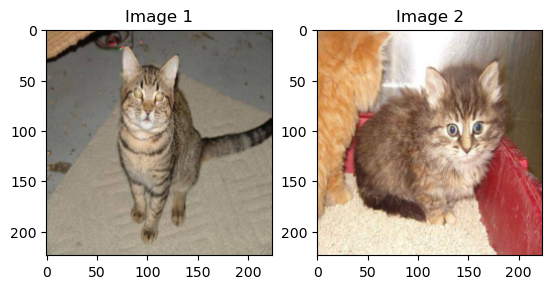

In [4]:
# Create a DataLoader
dataset = ActivationDataset('activations_catdog_vit_b/catdog_activations_0.h5','vit.encoder.layer.0.output')

data_loader = DataLoader(dataset, batch_size=32, shuffle=True)
input_image1 = next(iter(data_loader))[0][0]
input_image2 = next(iter(data_loader))[0][1]
fig, axs = plt.subplots(1, 2)
axs[0].imshow(input_image1.permute(1, 2, 0))
axs[0].set_title('Image 1')
axs[1].imshow(input_image2.permute(1, 2, 0))
axs[1].set_title('Image 2')
plt.show()


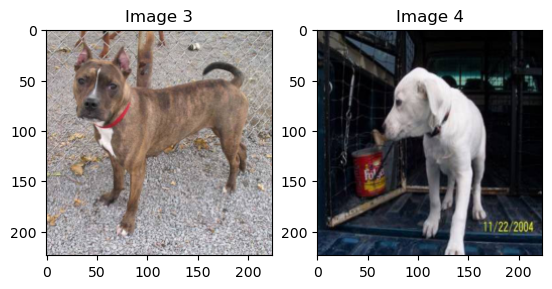

In [5]:
# Create a DataLoader
dataset = ActivationDataset('activations_catdog_vit_b/catdog_activations_1.h5','vit.encoder.layer.0.output')

data_loader = DataLoader(dataset, batch_size=32, shuffle=True)
input_image3 = next(iter(data_loader))[0][0]
input_image4 = next(iter(data_loader))[0][1]
fig, axs = plt.subplots(1, 2)
axs[0].imshow(input_image3.permute(1, 2, 0))
axs[0].set_title('Image 3')
axs[1].imshow(input_image4.permute(1, 2, 0))
axs[1].set_title('Image 4')
plt.show()


# x10 SAE model

layer 0


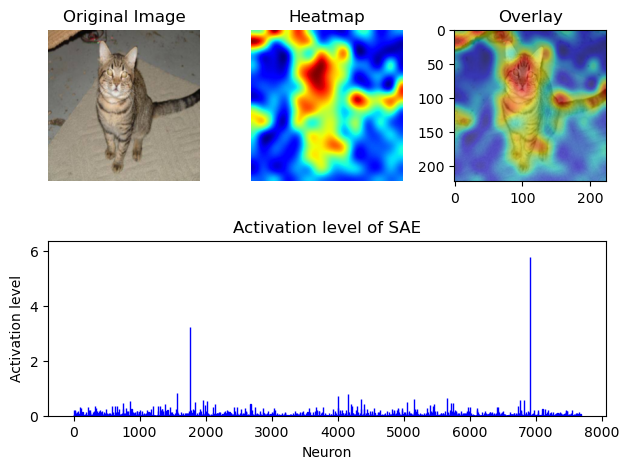

layer 1


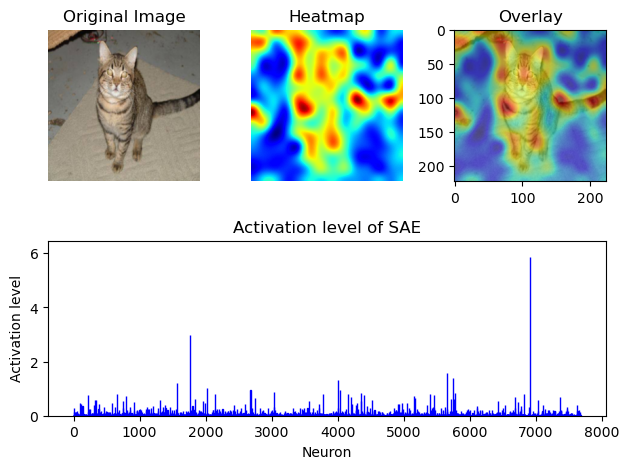

layer 2


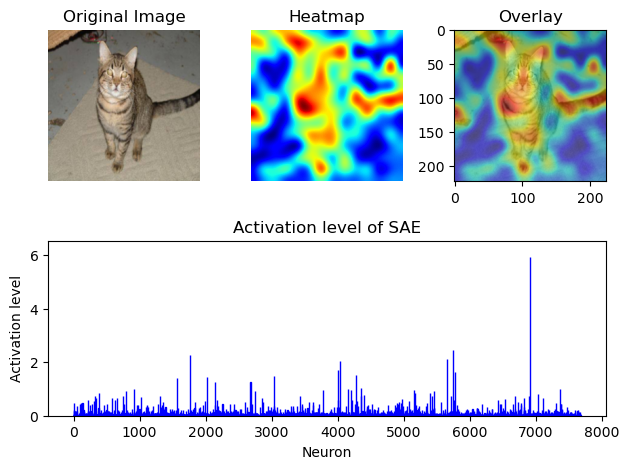

layer 3


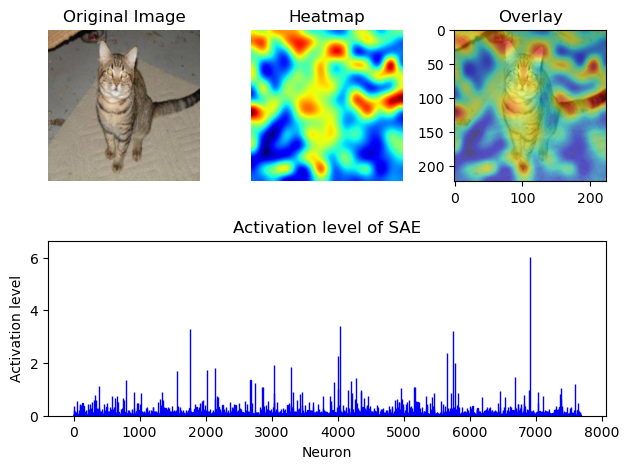

layer 4


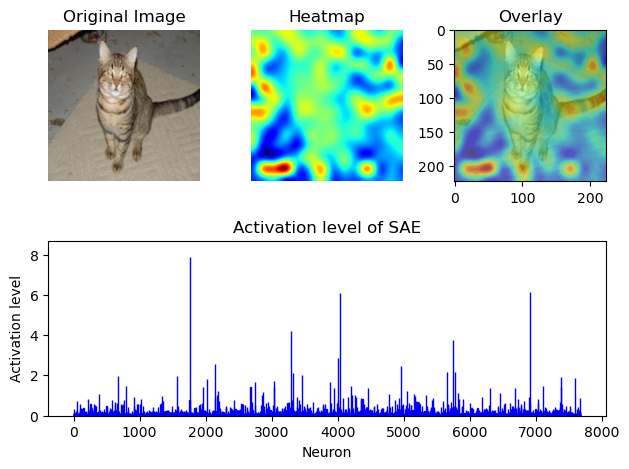

layer 5


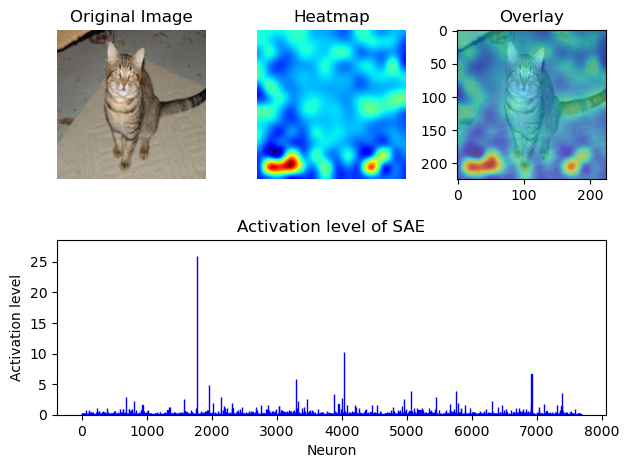

layer 6


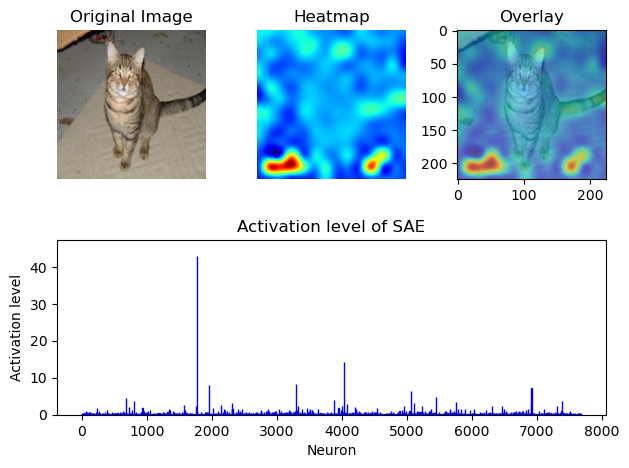

layer 7


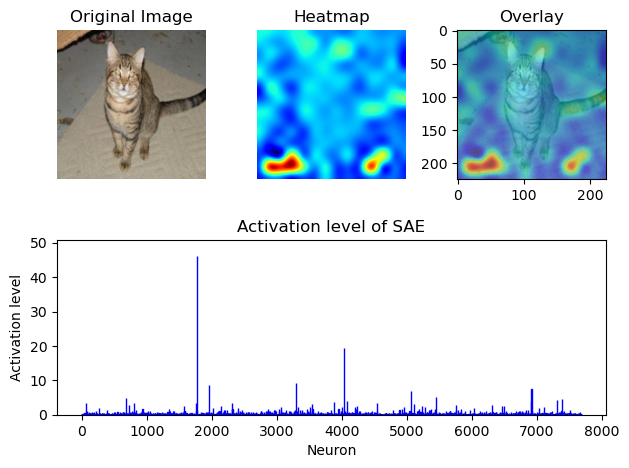

layer 8


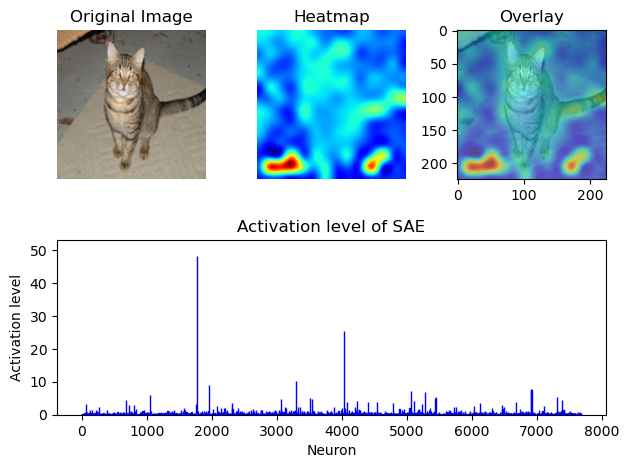

layer 9


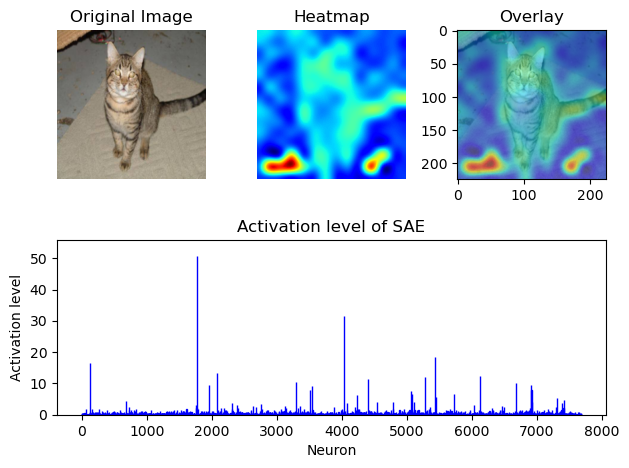

layer 10


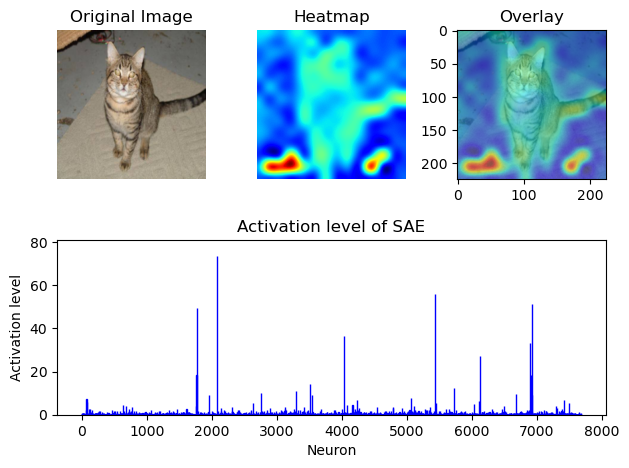

layer 11


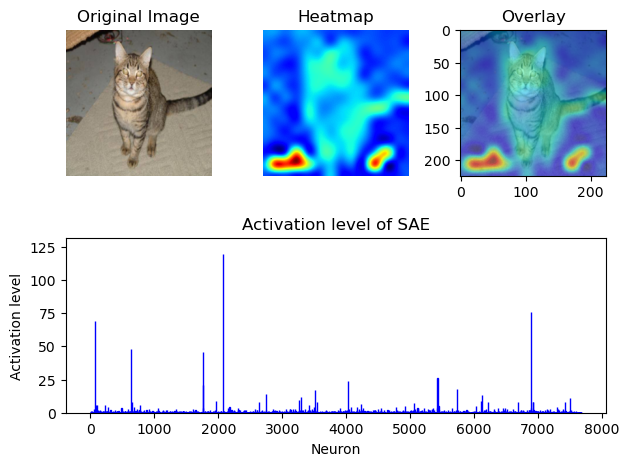

In [7]:
for i in range(12):
    print(f'layer {i}')
    plot_activation('akahana/vit-base-cats-vs-dogs','SAE_models/catdog_finetune/SAE_ratio10_epoch100_lr0.0001.pth',input_image1,layer_number = i, ratio=10, device= device)

layer 0


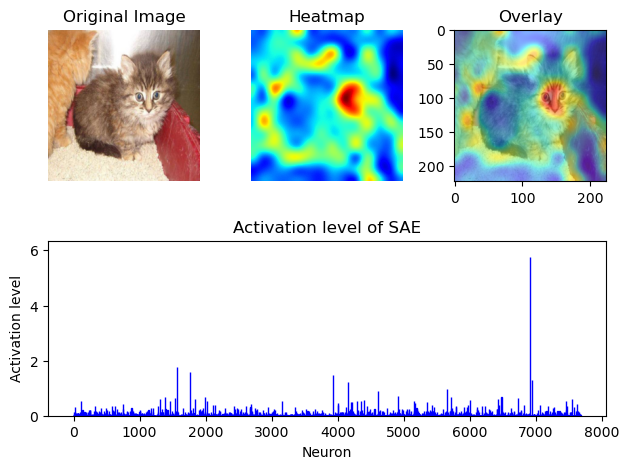

layer 1


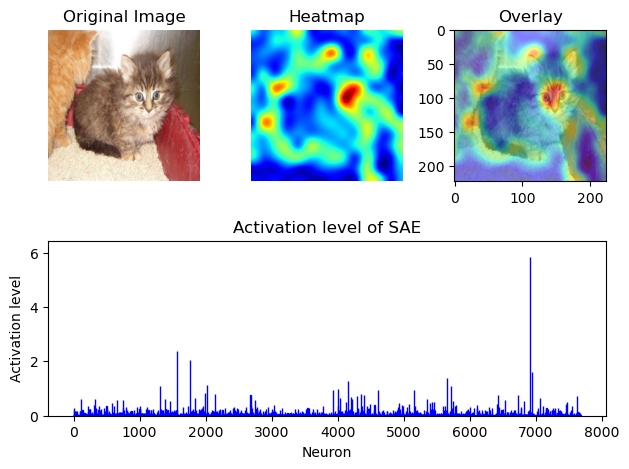

layer 2


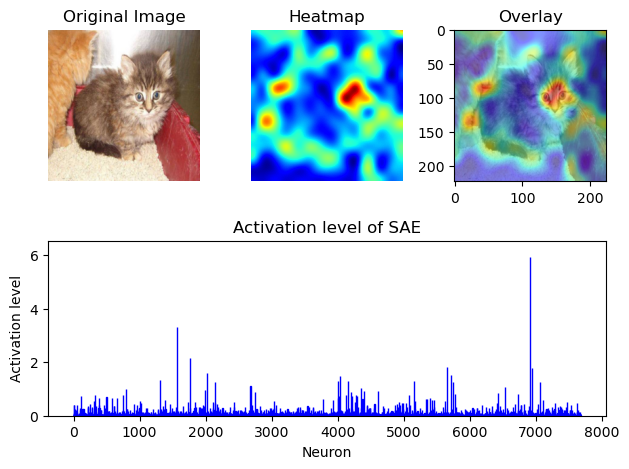

layer 3


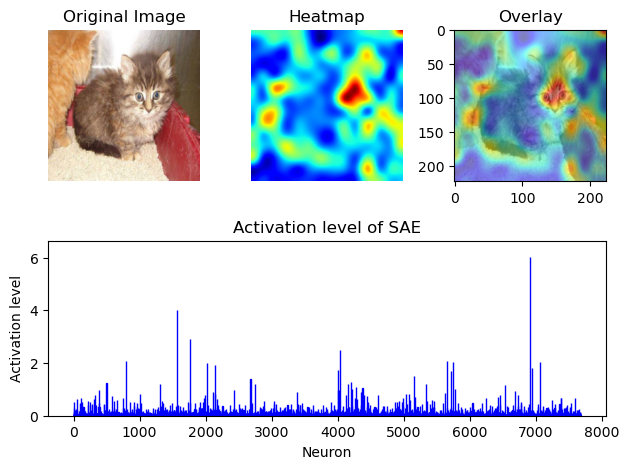

layer 4


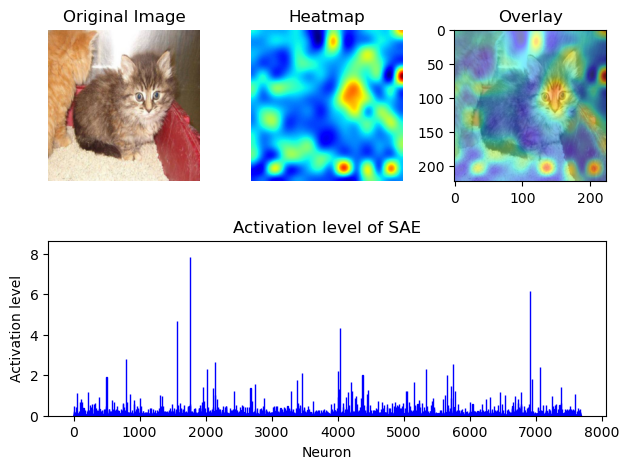

layer 5


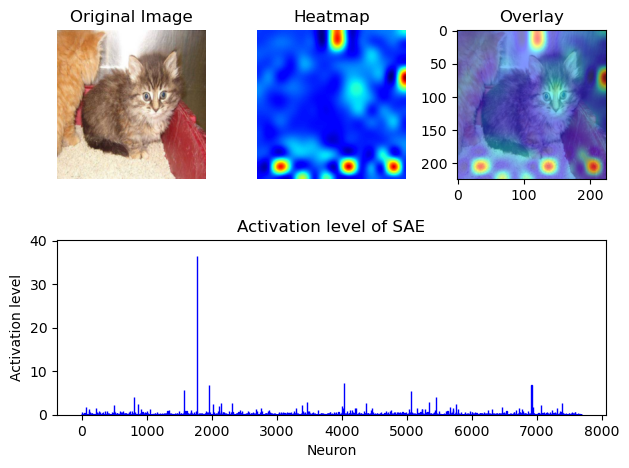

layer 6


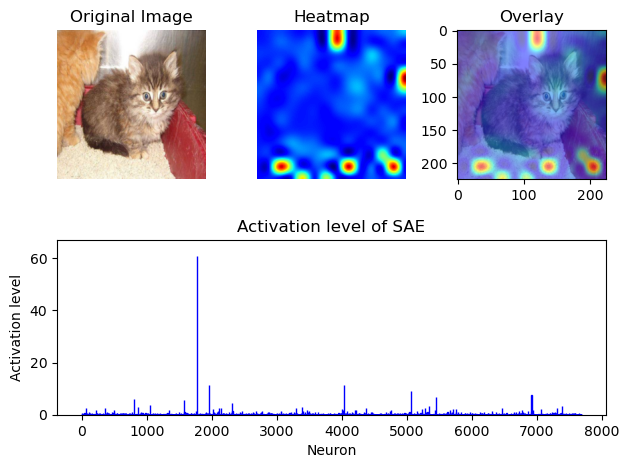

layer 7


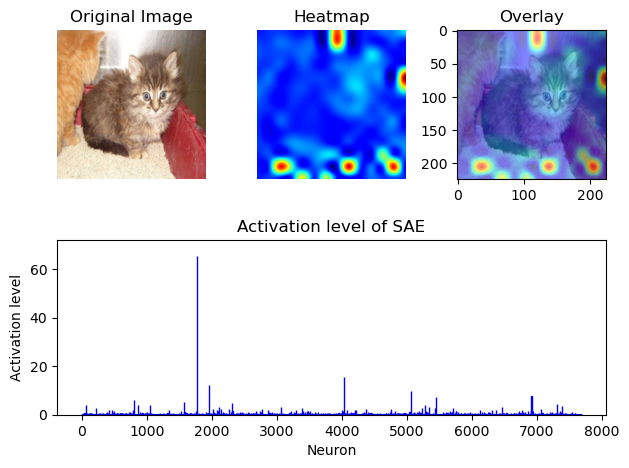

layer 8


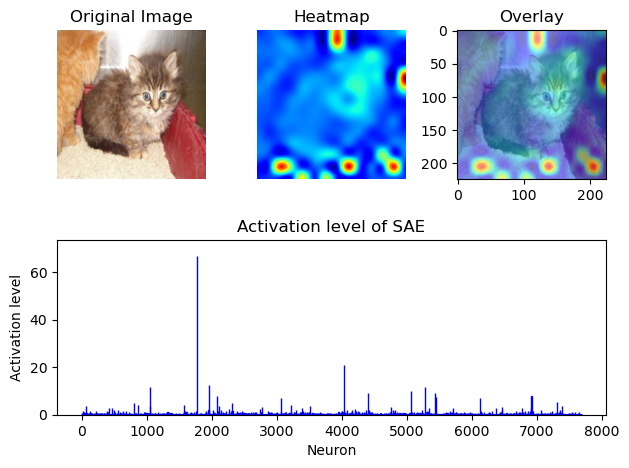

layer 9


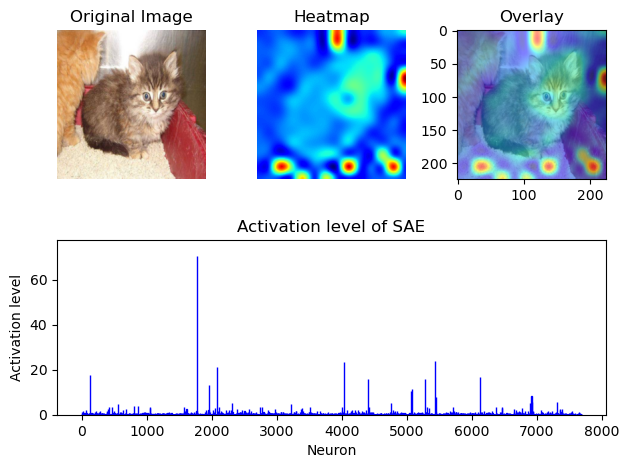

layer 10


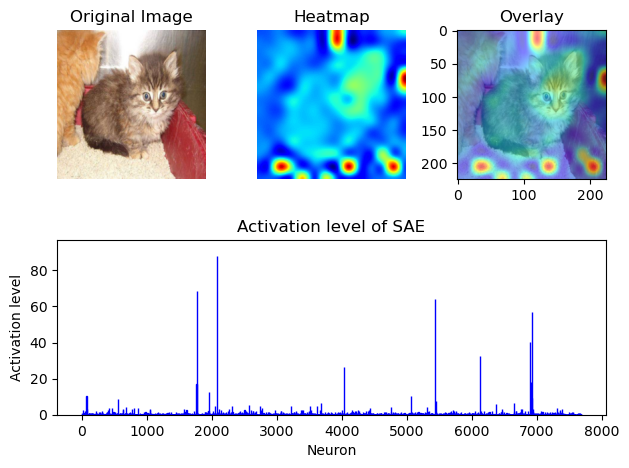

layer 11


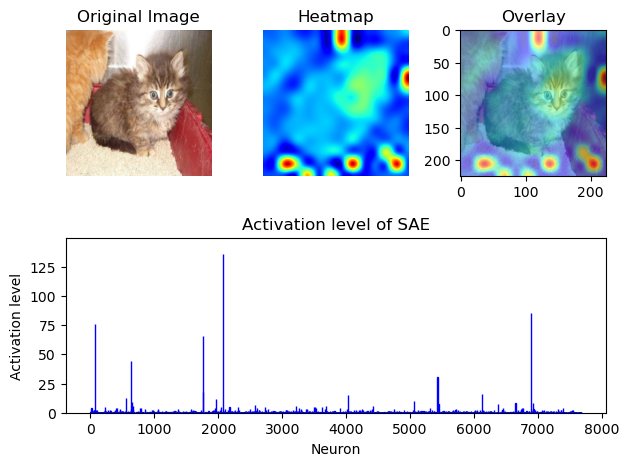

In [8]:
for i in range(12):
    print(f'layer {i}')
    plot_activation('akahana/vit-base-cats-vs-dogs','SAE_models/catdog_finetune/SAE_ratio10_epoch100_lr0.0001.pth',input_image2,layer_number = i, ratio=10, device= device)

layer 0


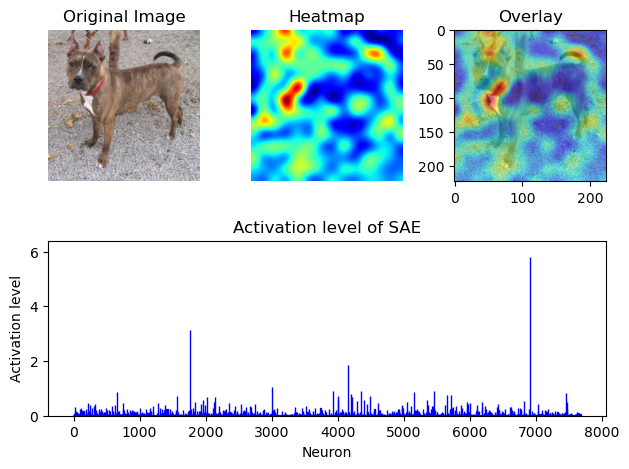

layer 1


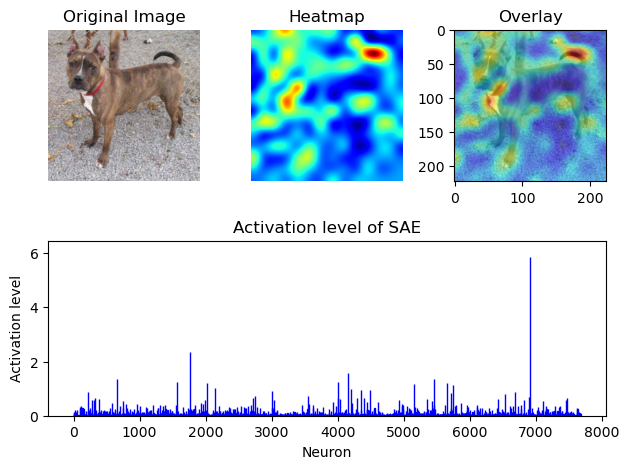

layer 2


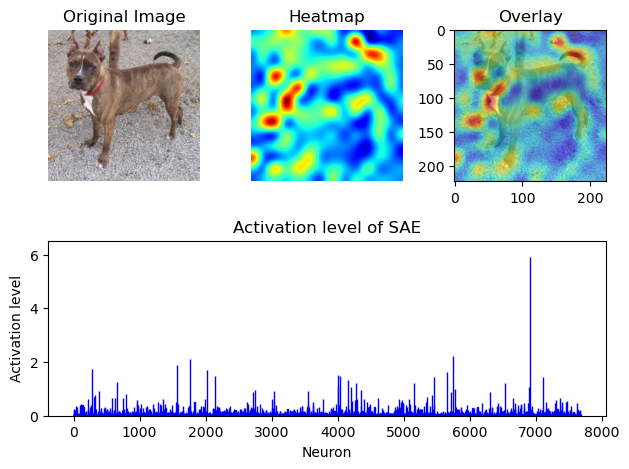

layer 3


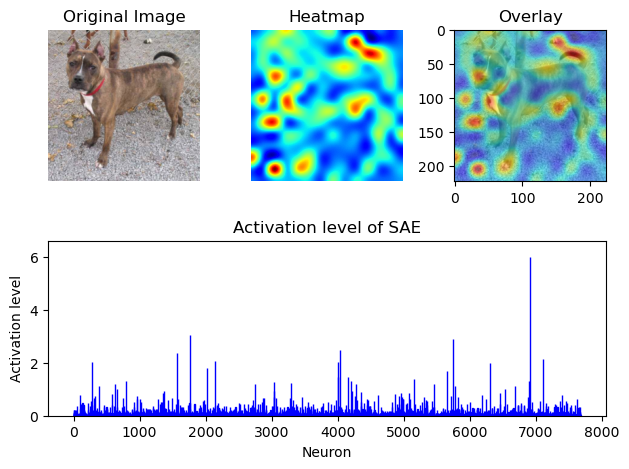

layer 4


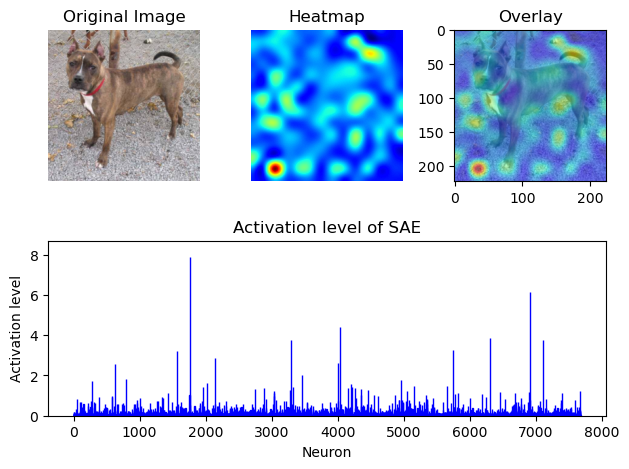

layer 5


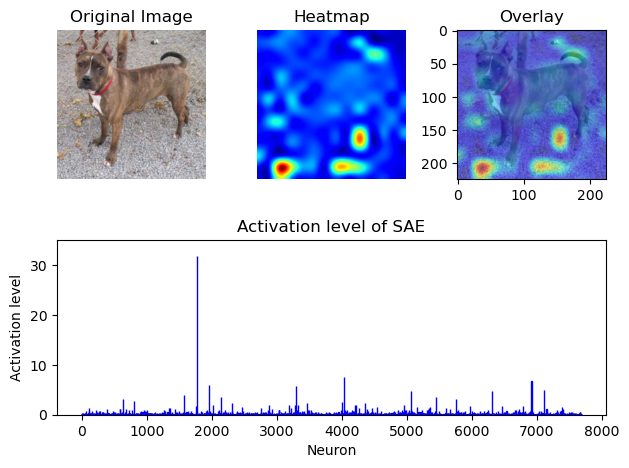

layer 6


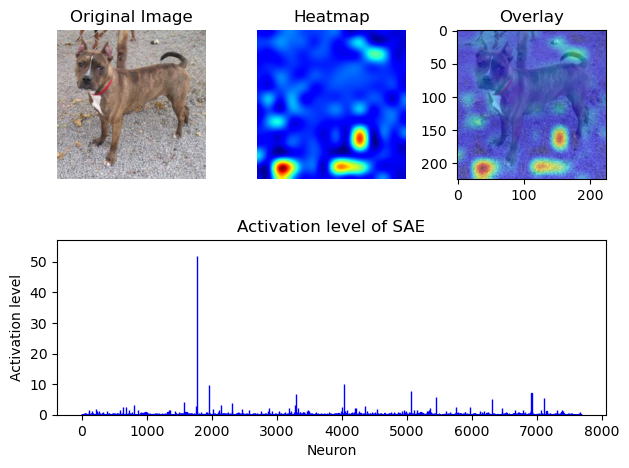

layer 7


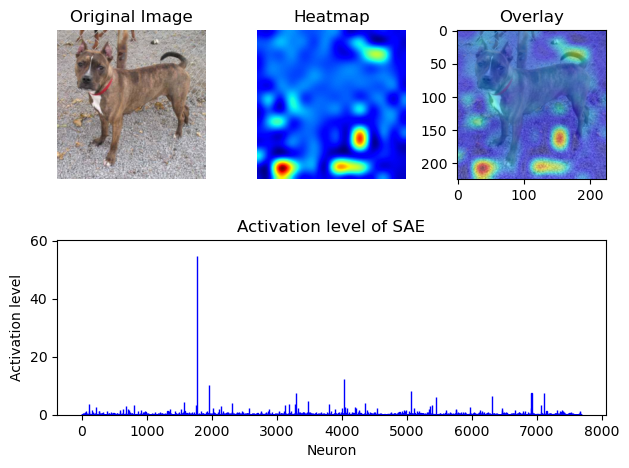

layer 8


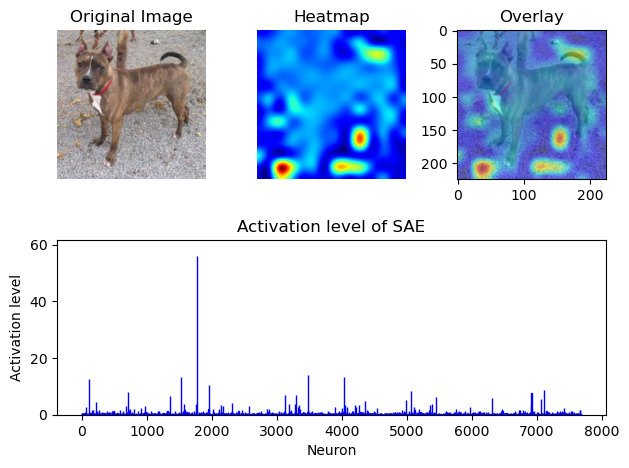

layer 9


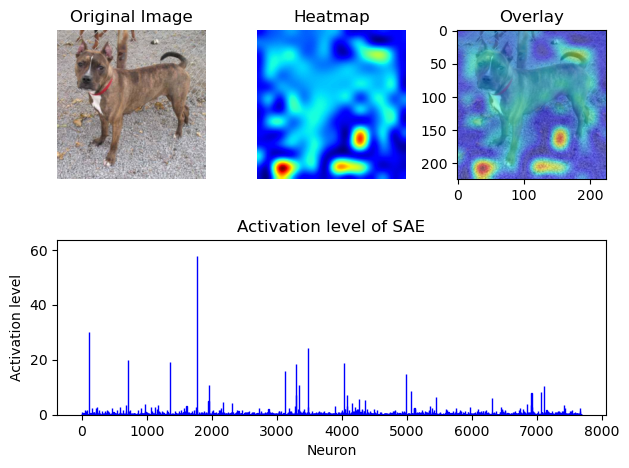

layer 10


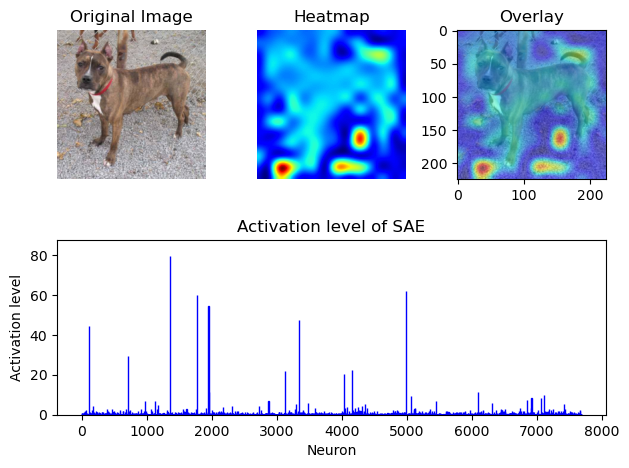

layer 11


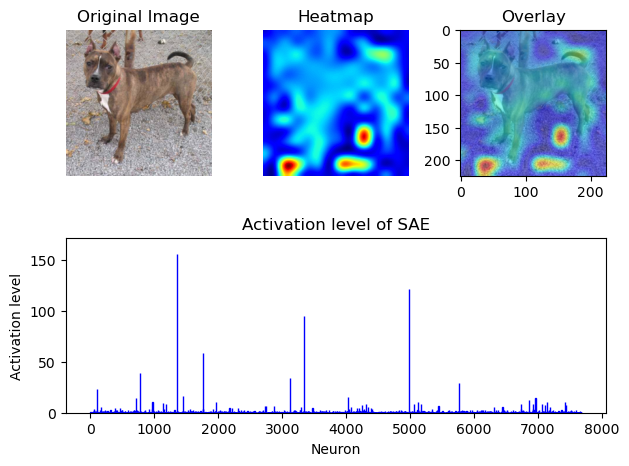

In [9]:
for i in range(12):
    print(f'layer {i}')
    plot_activation('akahana/vit-base-cats-vs-dogs','SAE_models/catdog_finetune/SAE_ratio10_epoch100_lr0.0001.pth',input_image3,layer_number = i, ratio=10, device= device)

layer 0


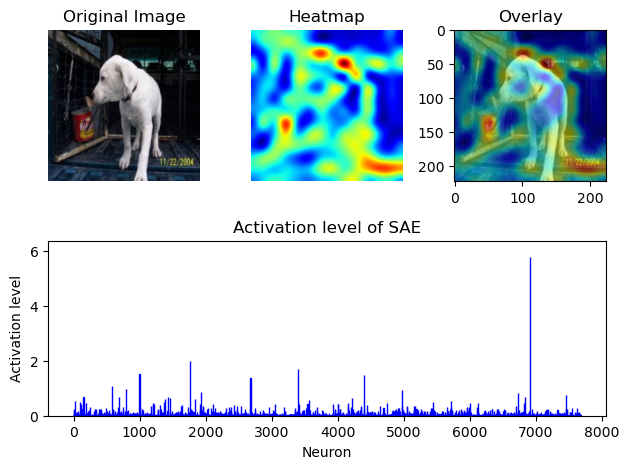

layer 1


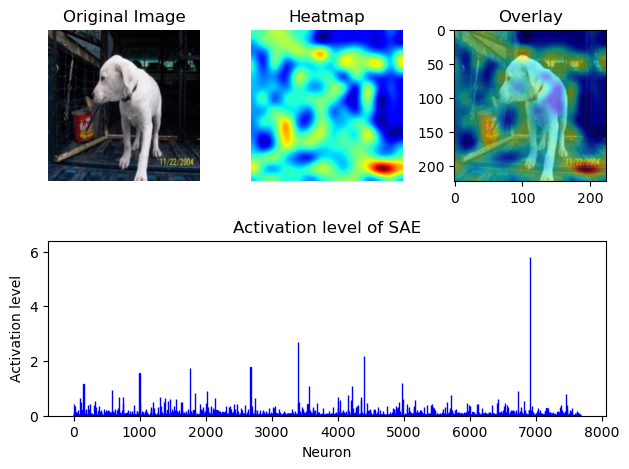

layer 2


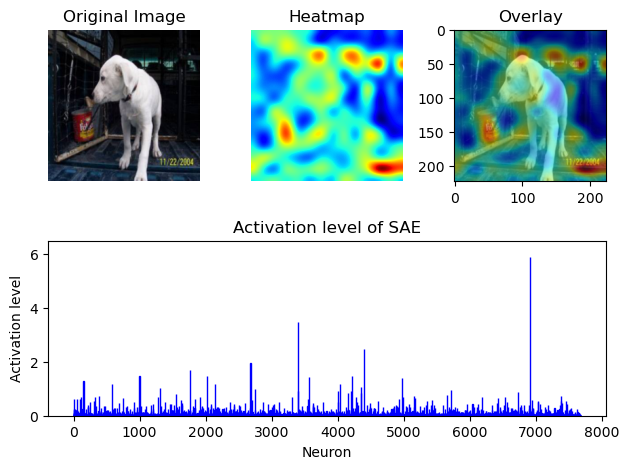

layer 3


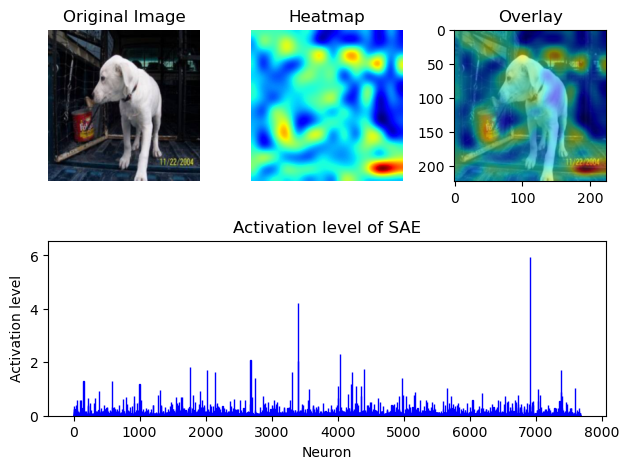

layer 4


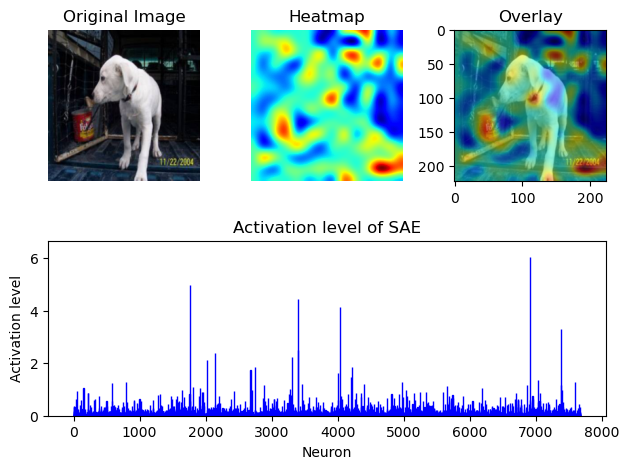

layer 5


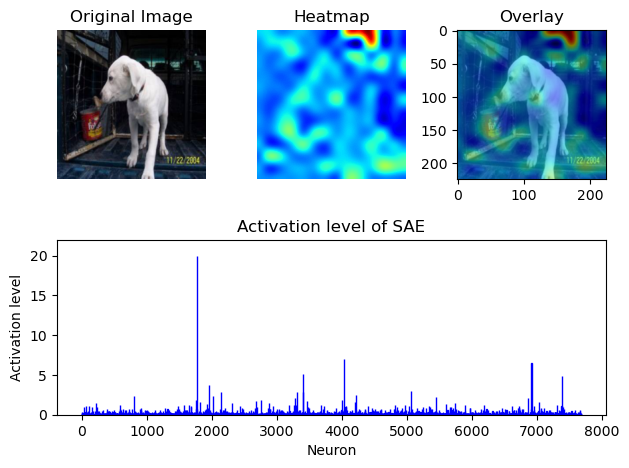

layer 6


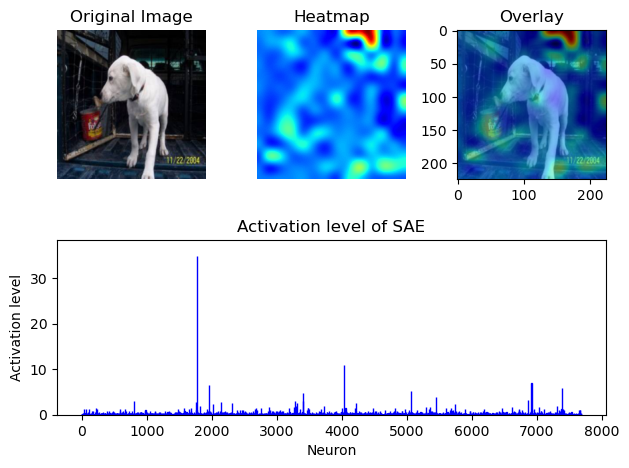

layer 7


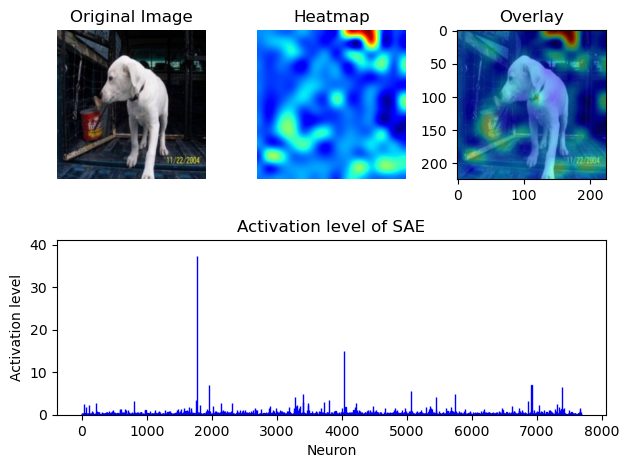

layer 8


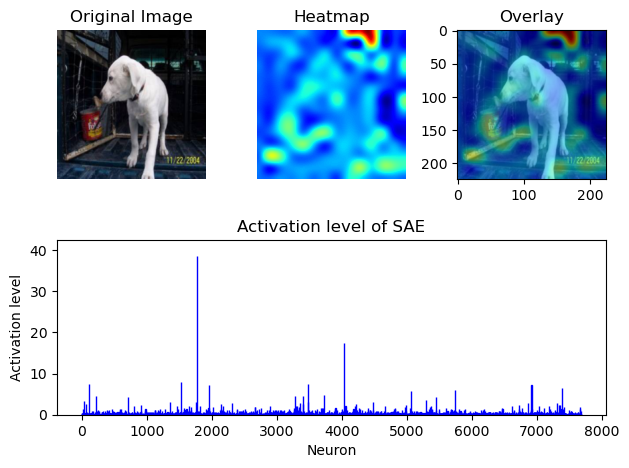

layer 9


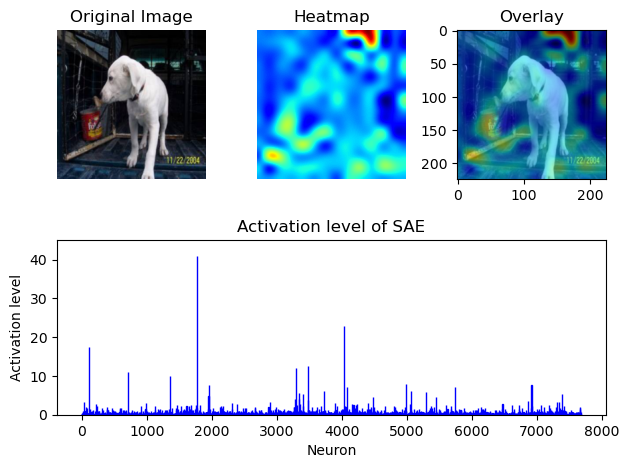

layer 10


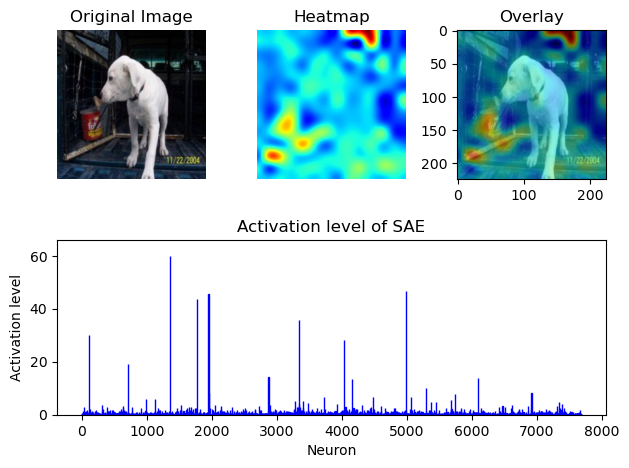

layer 11


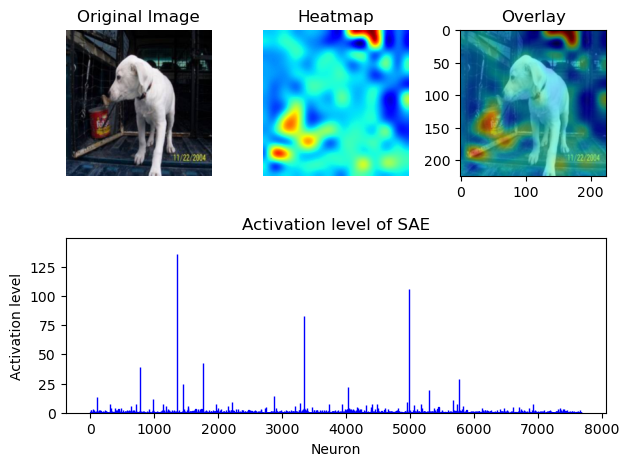

In [10]:
for i in range(12):
    print(f'layer {i}')
    plot_activation('akahana/vit-base-cats-vs-dogs','SAE_models/catdog_finetune/SAE_ratio10_epoch100_lr0.0001.pth',input_image4,layer_number = i, ratio=10, device= device)

## top 10 activated features in each layer

In [11]:
input1 = processor(images=to_pil(input_image1), return_tensors="pt").to(device)
input2 = processor(images=to_pil(input_image2), return_tensors="pt").to(device)
input3 = processor(images=to_pil(input_image3), return_tensors="pt").to(device)
input4 = processor(images=to_pil(input_image4), return_tensors="pt").to(device)

activation_inputs1 = model(**input1)['hidden_states'][1:]
activation_inputs2 = model(**input2)['hidden_states'][1:]
activation_inputs3 = model(**input3)['hidden_states'][1:]
activation_inputs4 = model(**input4)['hidden_states'][1:]

# initiate the encoder and encoder_bias for SAE
encoder = torch.randn((7680, 768)) # encoder
nn.init.xavier_uniform_(encoder)
encoder_bias = torch.zeros(7680) # encoder bias

# Create a SAE instance
tied_sae = TiedSAE(encoder, encoder_bias)
tied_sae.load_state_dict(torch.load('SAE_models/catdog_finetune/SAE_ratio10_epoch100_lr0.0001.pth'))
tied_sae.to_device(device)

# Calculate the activation levels for the input patch
activations_1 =[]
activations_2 =[]
activations_3 =[]
activations_4 =[]


for i in range(12):
    activations_1.append(tied_sae.encode(activation_inputs1[i]).squeeze(0))
    activations_2.append(tied_sae.encode(activation_inputs2[i]).squeeze(0))
    activations_3.append(tied_sae.encode(activation_inputs3[i]).squeeze(0))
    activations_4.append(tied_sae.encode(activation_inputs4[i]).squeeze(0))


In [12]:
top_features1 = []
top_features2 = []
top_features3 = []
top_features4 = []

for i in range(12):
    # Detach the tensors before passing them to torch.topk()
    tensor1 = activations_1[i].mean(dim=0).detach().cpu()
    tensor2 = activations_2[i].mean(dim=0).detach().cpu()
    tensor3 = activations_3[i].mean(dim=0).detach().cpu()
    tensor4 = activations_4[i].mean(dim=0).detach().cpu()

    top_features1.append(torch.topk(tensor1, k=10, largest=True).indices)
    top_features2.append(torch.topk(tensor2, k=10, largest=True).indices)
    top_features3.append(torch.topk(tensor3, k=10, largest=True).indices)
    top_features4.append(torch.topk(tensor4, k=10, largest=True).indices)

In [13]:
print("Image 1")
[print(i) for i in top_features1]

print("Image 2")
[print(i) for i in top_features2]

print("Image 3")
[print(i) for i in top_features3]

print("Image 4")
[print(i) for i in top_features4]

Image 1
tensor([6917, 1765, 1566, 4158, 4008, 5659, 4350, 5153, 1958, 6820])
tensor([6917, 1765, 5659, 5752, 4008, 1566, 2019, 4031, 2680, 3035])
tensor([6917, 5752, 1765, 5659, 4031, 4008, 5779, 4273, 3035, 2019])
tensor([6917, 4031, 1765, 5752, 5659, 4008, 5779, 3035, 3294, 2146])
tensor([1765, 6917, 4031, 3294, 5752, 4008, 2146, 4954, 5659, 5779])
tensor([1765, 4031, 6917, 3294, 1958, 5057, 5752, 7384, 3877, 5444])
tensor([1765, 4031, 3294, 1958, 6917, 5057, 5444,  677, 3877,  794])
tensor([1765, 4031, 3294, 1958, 6917, 5057, 5444,  677, 7384, 7307])
tensor([1765, 4031, 3294, 1958, 6915, 6917, 5057, 5282, 1053, 5444])
tensor([1765, 4031, 5428,  122, 2075, 6118, 5282, 4408, 3294, 6685])
tensor([2075, 5428, 6930, 1765, 4031, 6894, 6118, 1762, 6910, 3507])
tensor([2075, 6894,   69,  628, 1765, 5428, 4031, 1762, 5726, 3507])
Image 2
tensor([6917, 1566, 1765, 3925, 6942, 4158, 5659, 4607, 4913, 6481])
tensor([6917, 1566, 1765, 6942, 5659, 4158, 2019, 1316, 5713, 4008])
tensor([6917, 1566

[None, None, None, None, None, None, None, None, None, None, None, None]

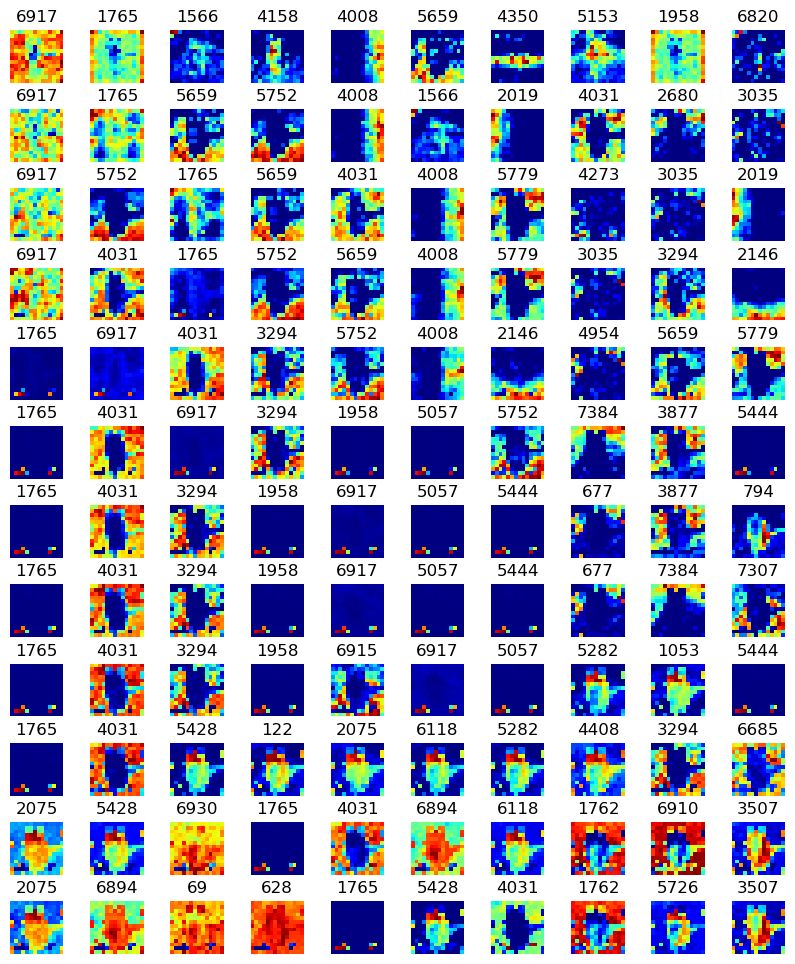

In [14]:
# Define a function to create a heatmap
def create_heatmap(activations, top_features):
    fig, axs = plt.subplots(12, 10, figsize=(10, 12))
    for i, layer_features in enumerate(top_features):
        for j, feature in enumerate(layer_features):
            ax = axs[i, j]
            sns.heatmap(activations[i][:,feature][1:].reshape(14,-1).detach().cpu().numpy(), cmap='jet', ax=ax, cbar=False)
            ax.set_title(f'{feature}')
            ax.axis('off')
    plt.subplots_adjust(wspace=0.5, hspace=0.5)  # Adjust spacing between subplots
    plt.show()

# Call the function for each image
create_heatmap(activations_1, top_features1)


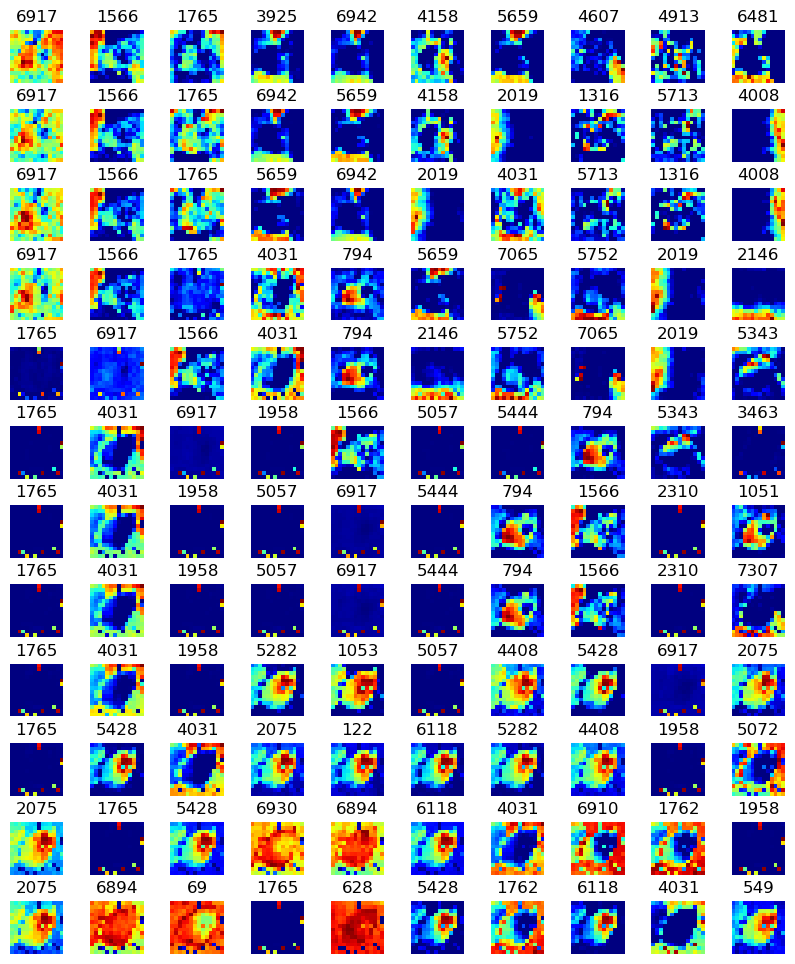

In [15]:
create_heatmap(activations_2, top_features2)

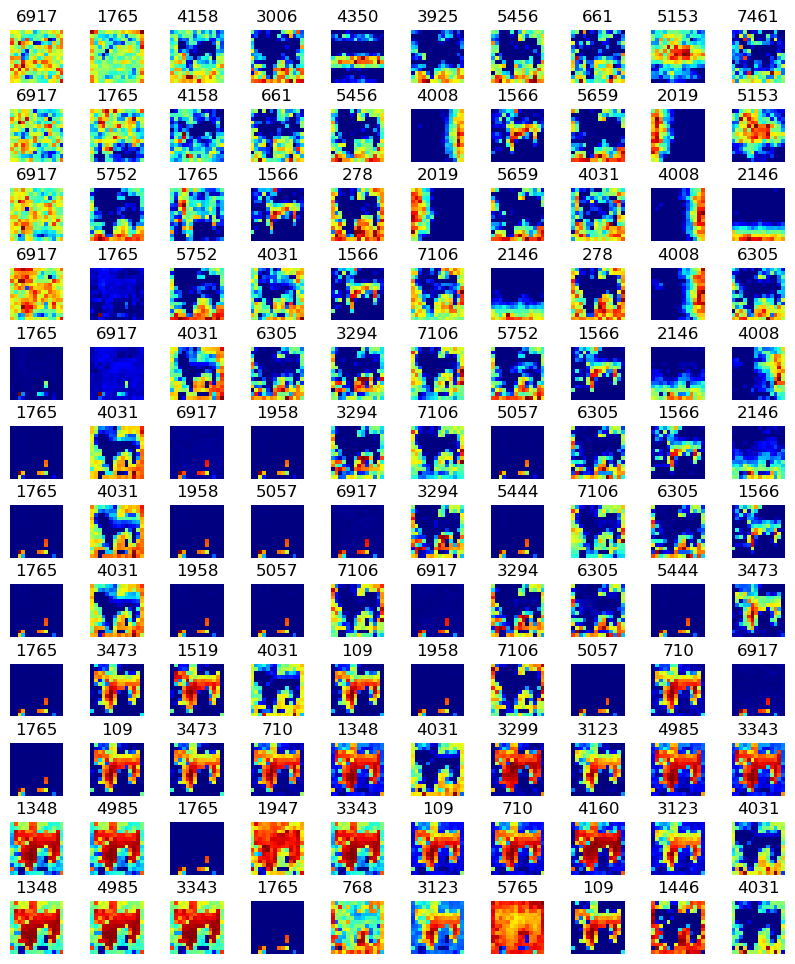

In [16]:
create_heatmap(activations_3, top_features3)

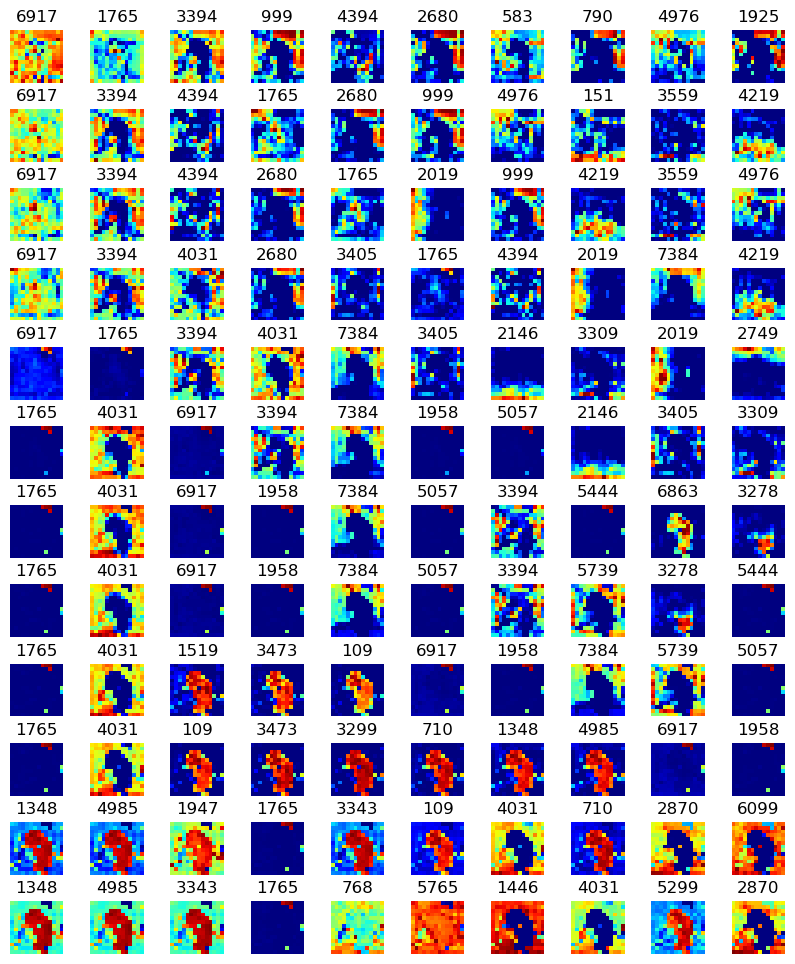

In [17]:
create_heatmap(activations_4, top_features4)

# x15 SAE model

layer 0


/ceph/kikang/miniconda3/envs/interp/lib/python3.11/site-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


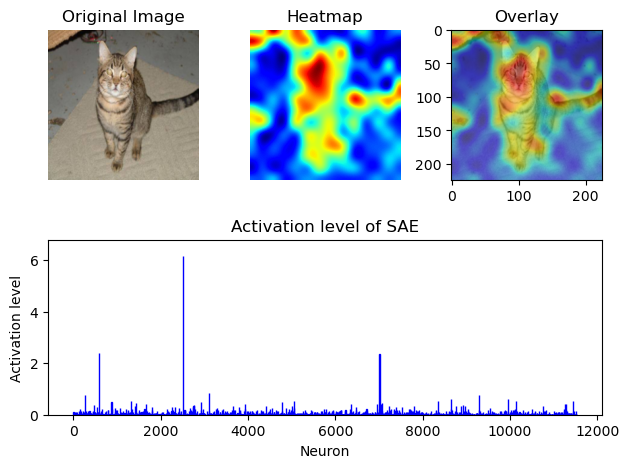

layer 1


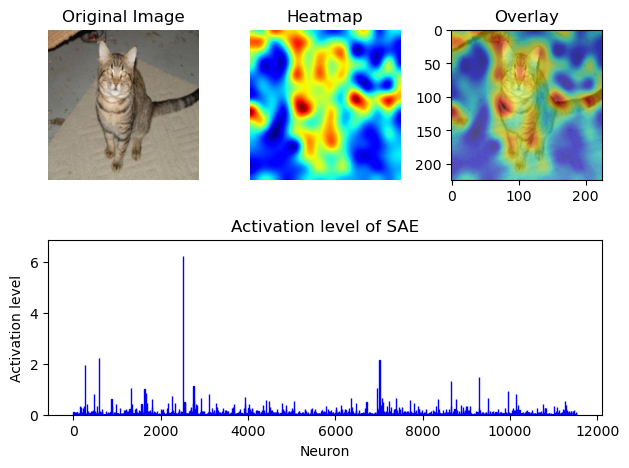

layer 2


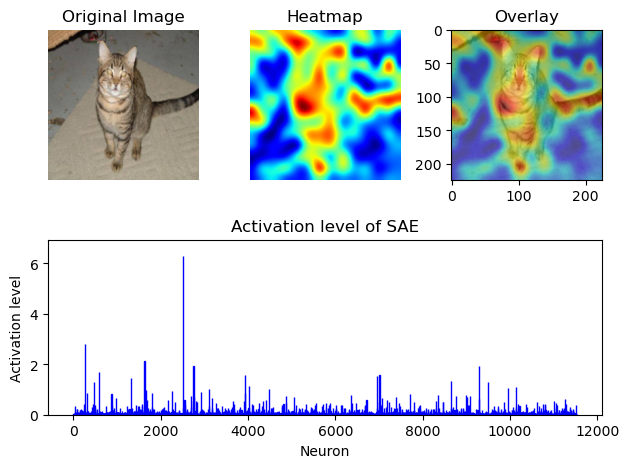

layer 3


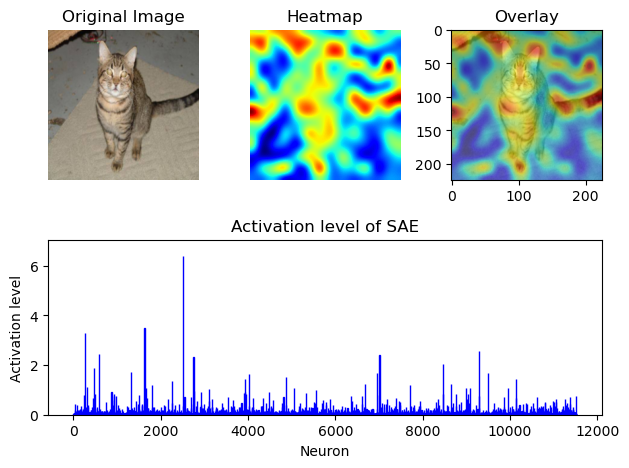

layer 4


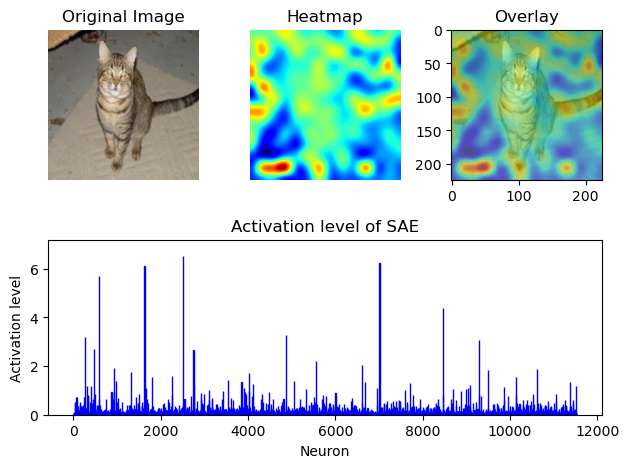

layer 5


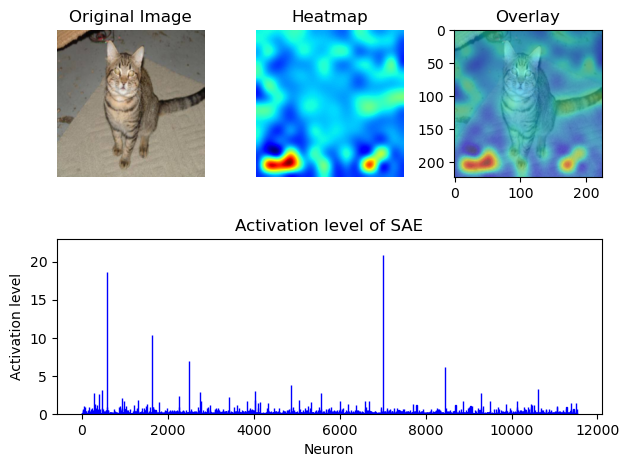

layer 6


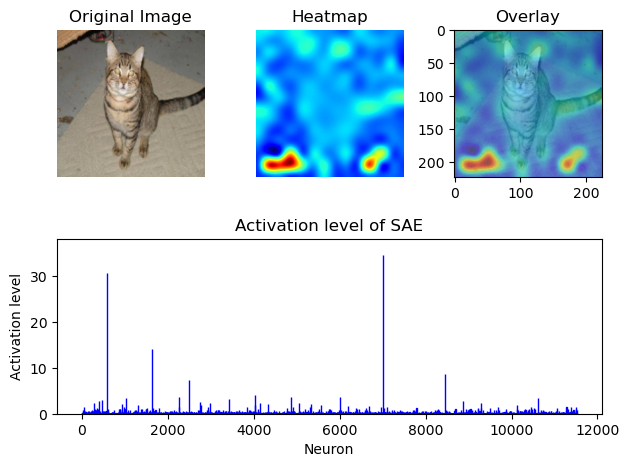

layer 7


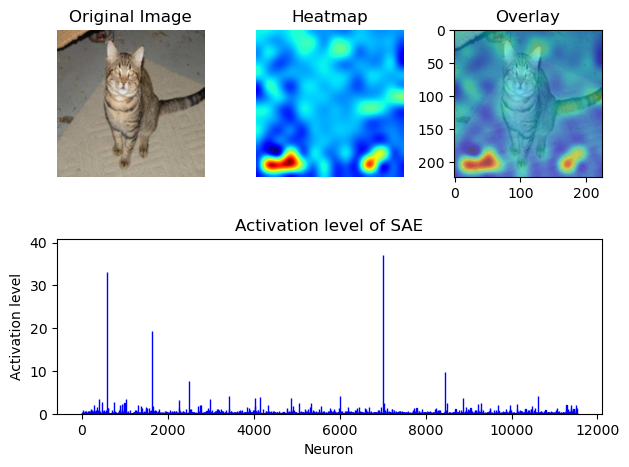

layer 8


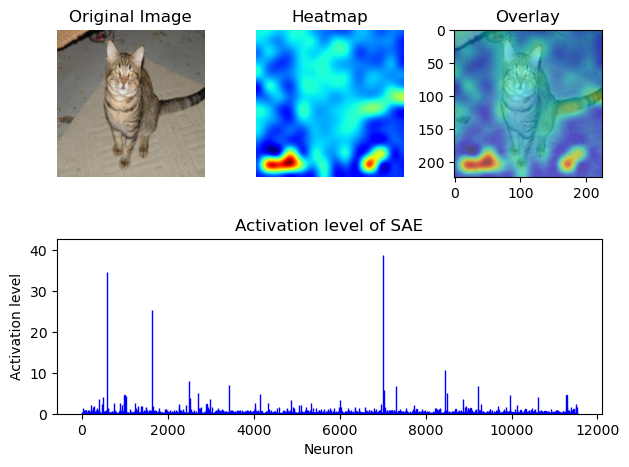

layer 9


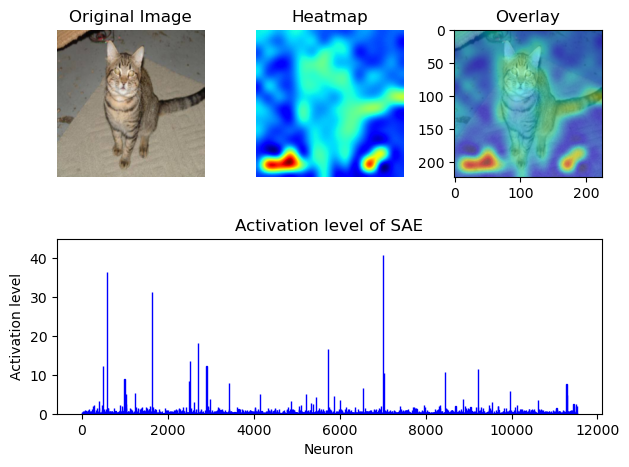

layer 10


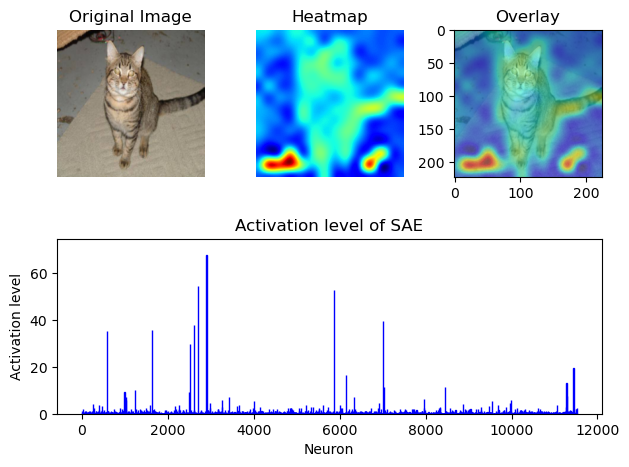

layer 11


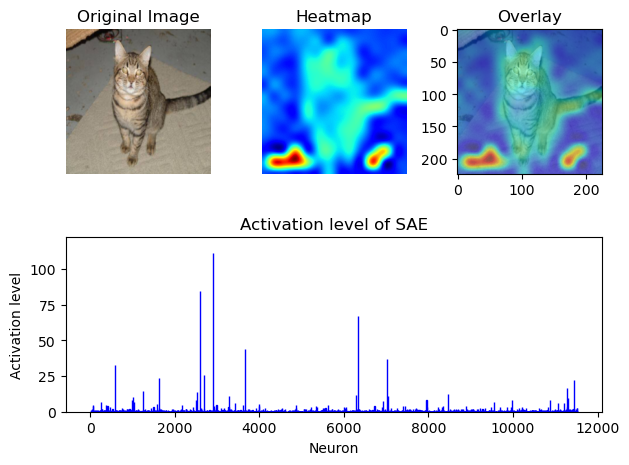

In [18]:
for i in range(12):
    print(f'layer {i}')
    plot_activation('akahana/vit-base-cats-vs-dogs','SAE_models/catdog_finetune/SAE_ratio15_epoch100_lr0.0001.pth',input_image1,layer_number = i, ratio=15, device= device)

layer 0


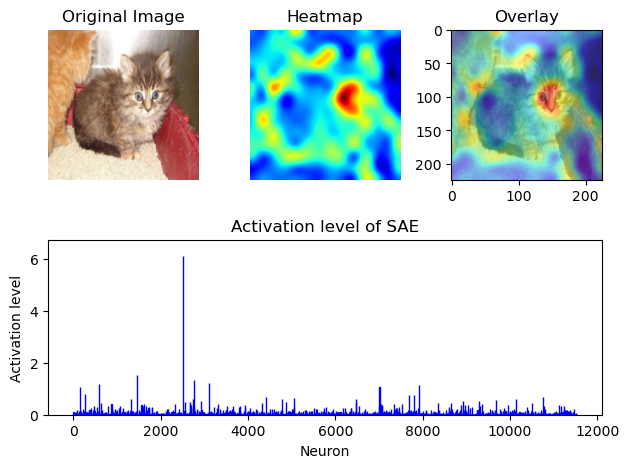

layer 1


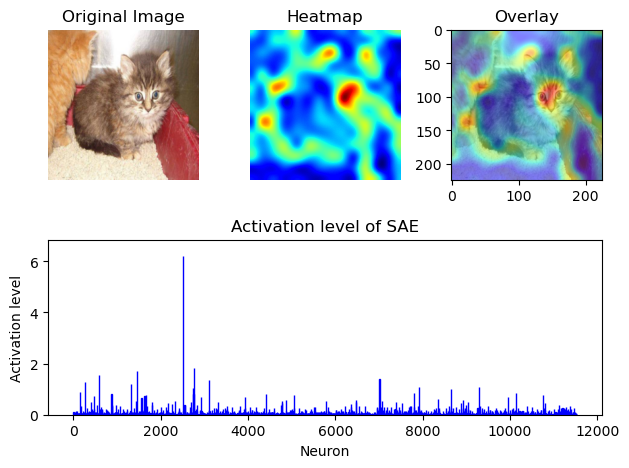

layer 2


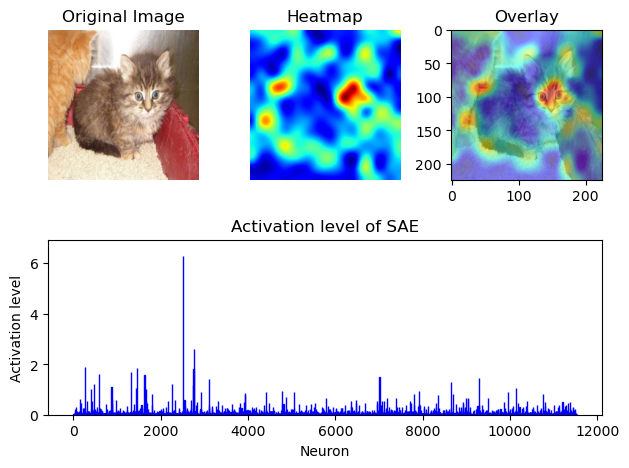

layer 3


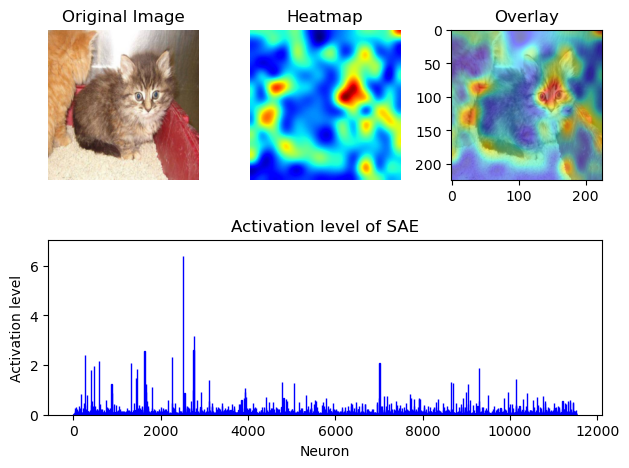

layer 4


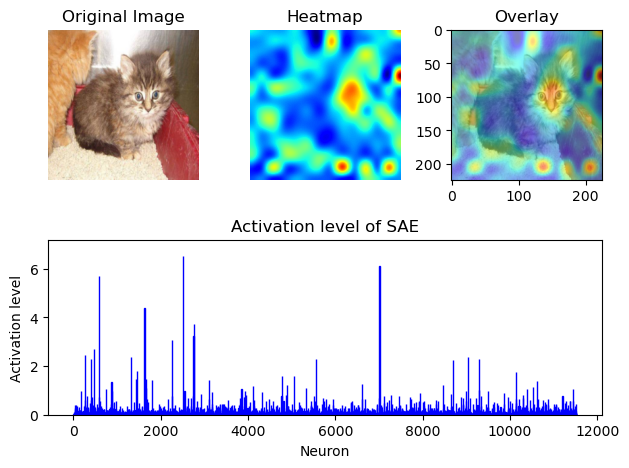

layer 5


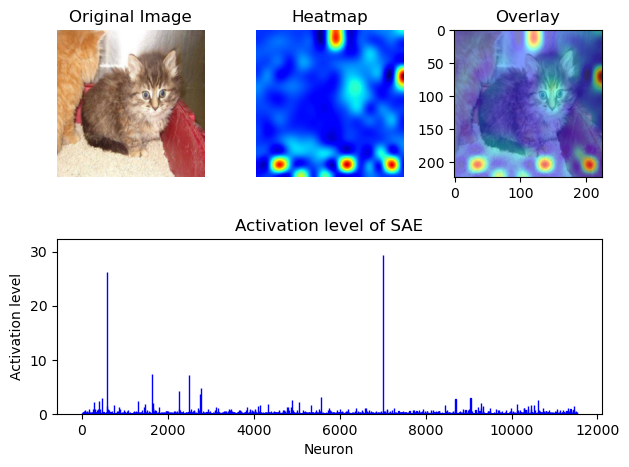

layer 6


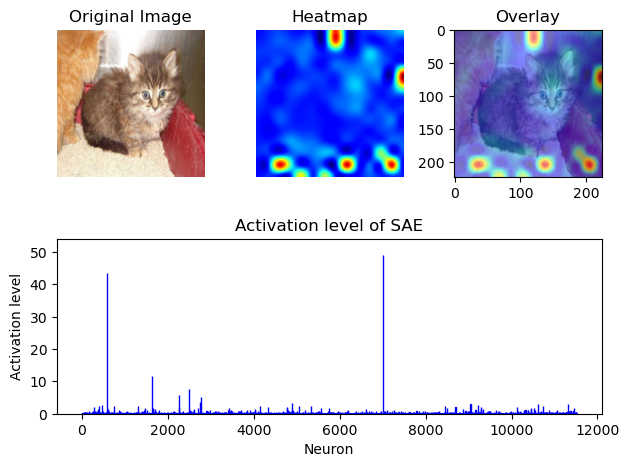

layer 7


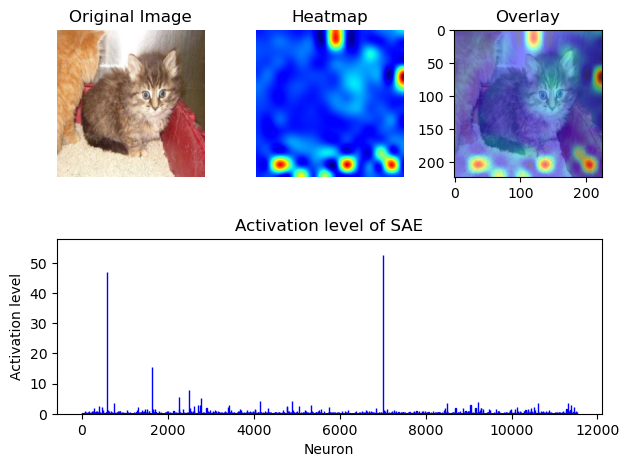

layer 8


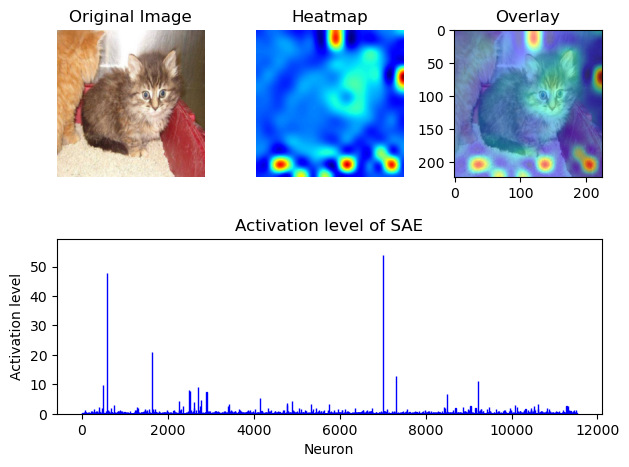

layer 9


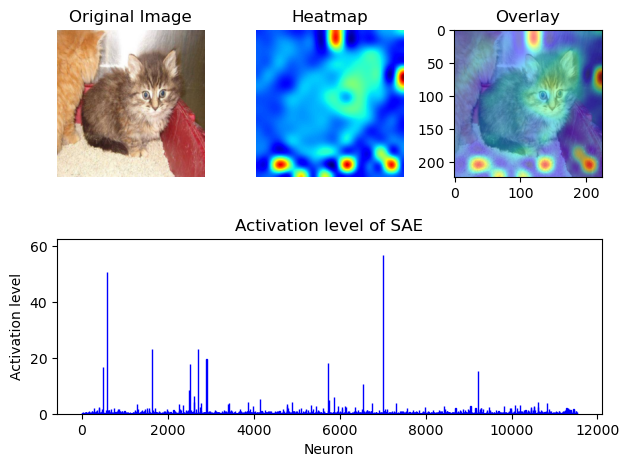

layer 10


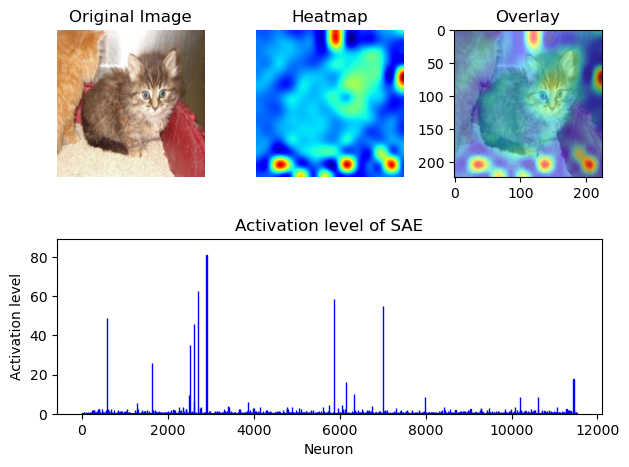

layer 11


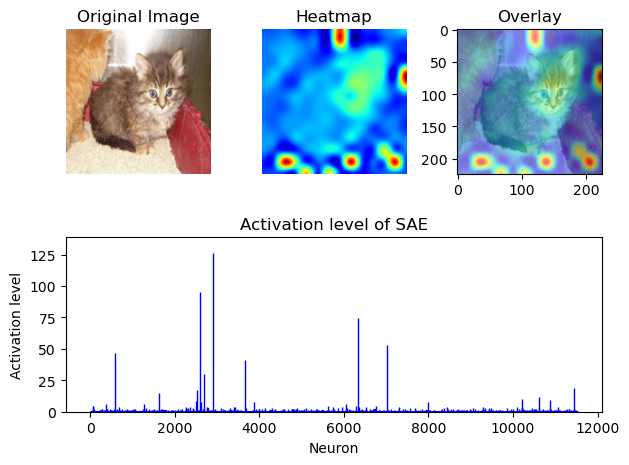

In [19]:
for i in range(12):
    print(f'layer {i}')
    plot_activation('akahana/vit-base-cats-vs-dogs','SAE_models/catdog_finetune/SAE_ratio15_epoch100_lr0.0001.pth',input_image2,layer_number = i, ratio=15, device= device)

layer 0


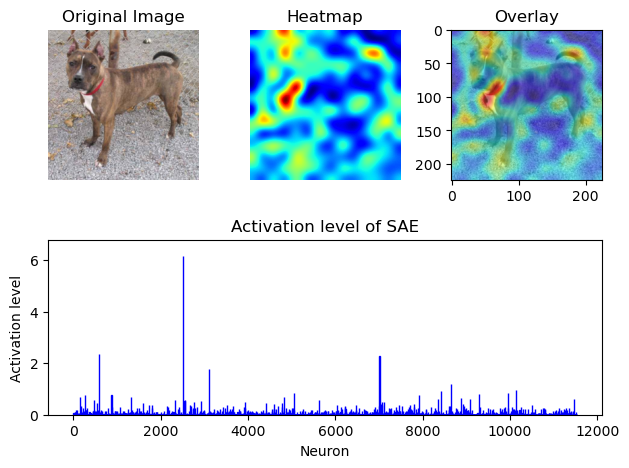

layer 1


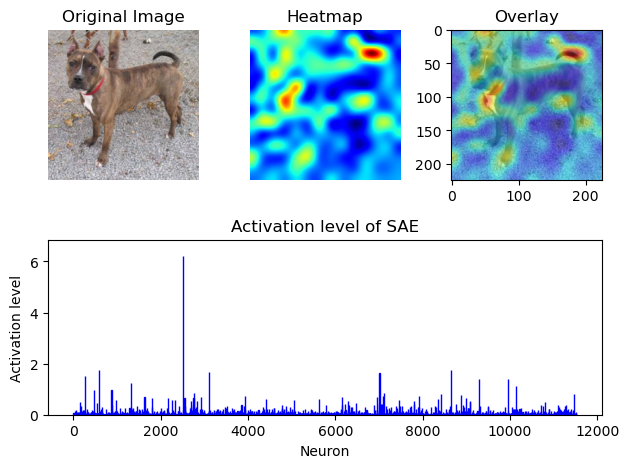

layer 2


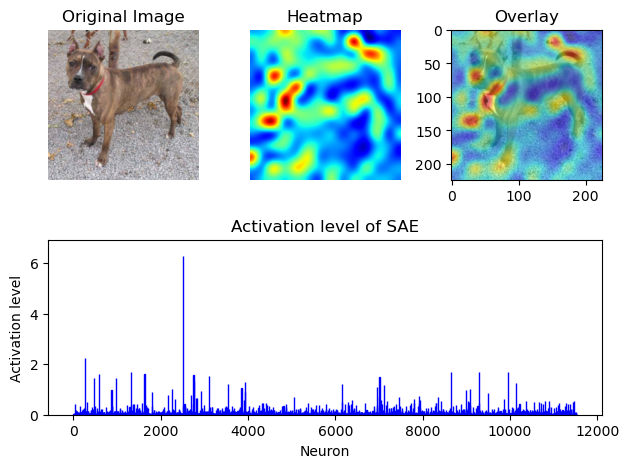

layer 3


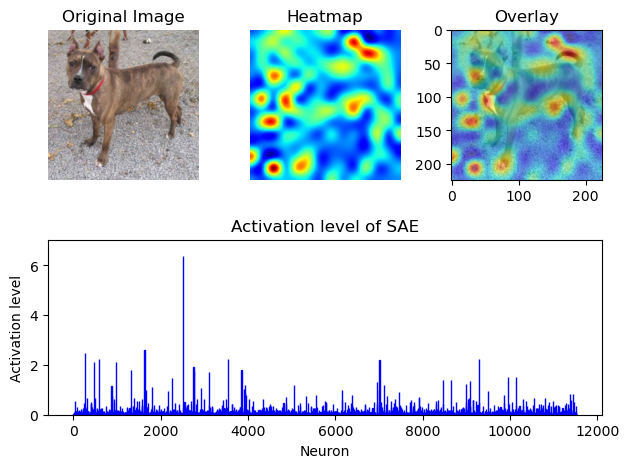

layer 4


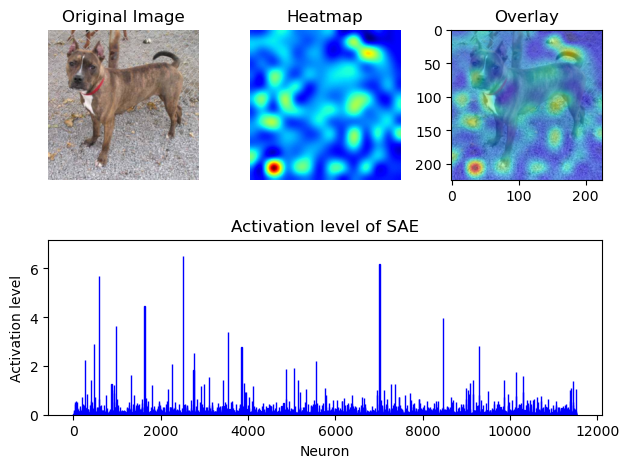

layer 5


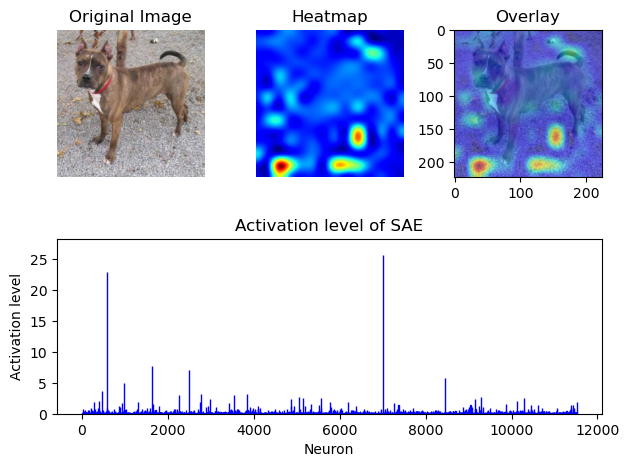

layer 6


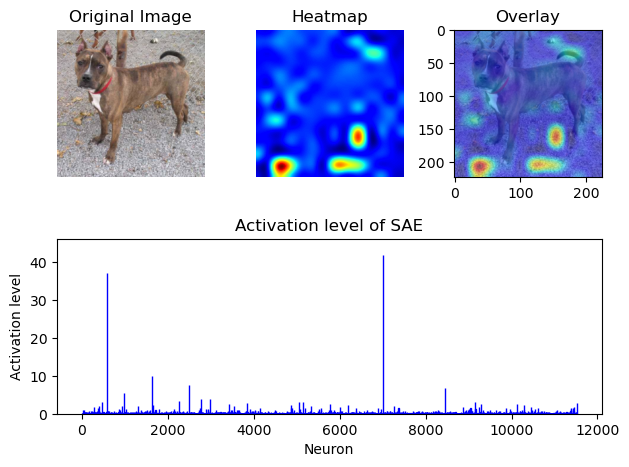

layer 7


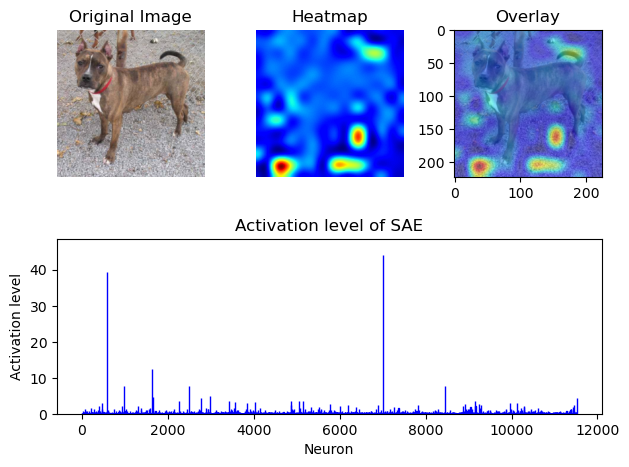

layer 8


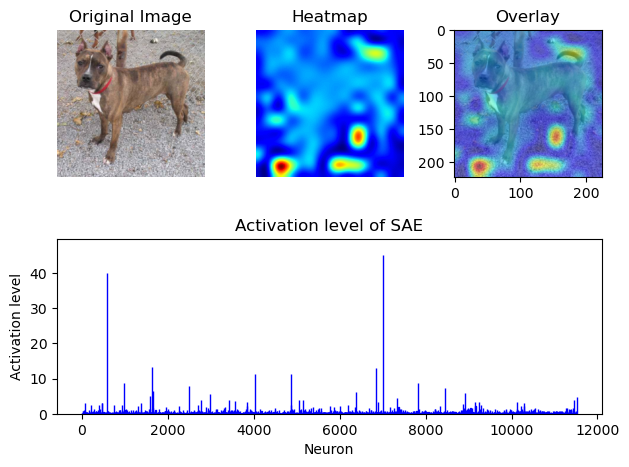

layer 9


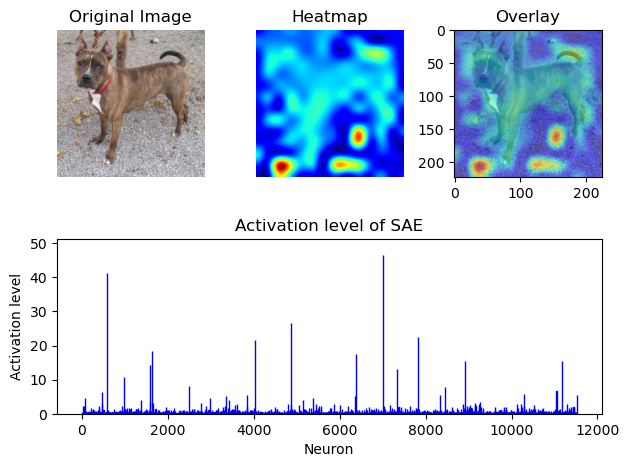

layer 10


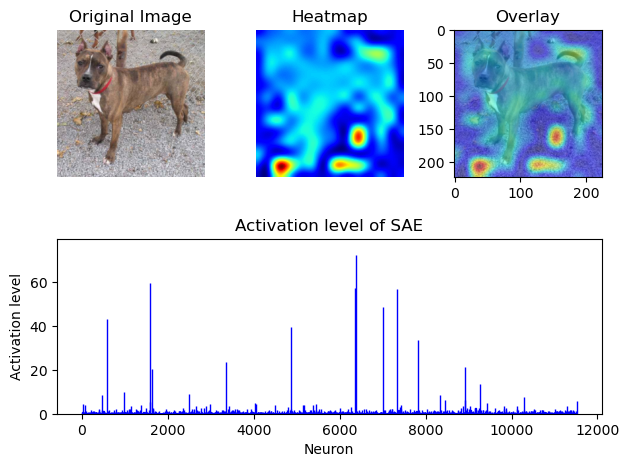

layer 11


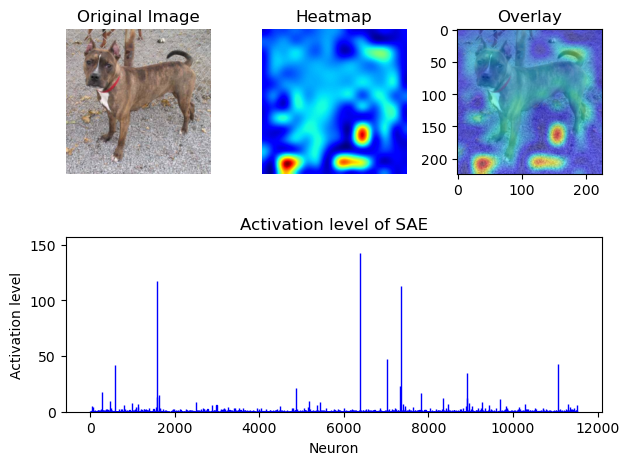

In [20]:
for i in range(12):
    print(f'layer {i}')
    plot_activation('akahana/vit-base-cats-vs-dogs','SAE_models/catdog_finetune/SAE_ratio15_epoch100_lr0.0001.pth',input_image3,layer_number = i, ratio=15, device= device)

layer 0


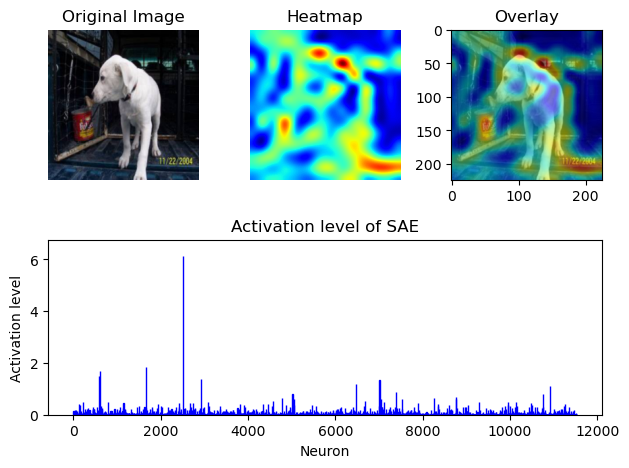

layer 1


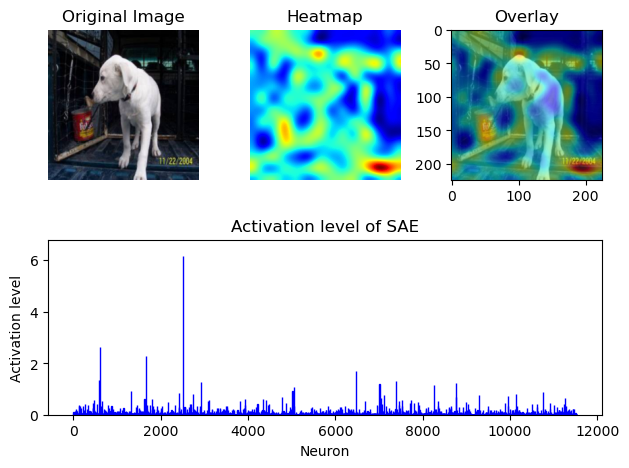

layer 2


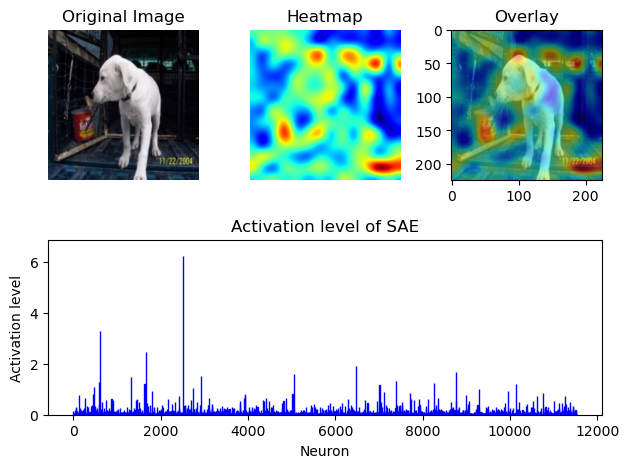

layer 3


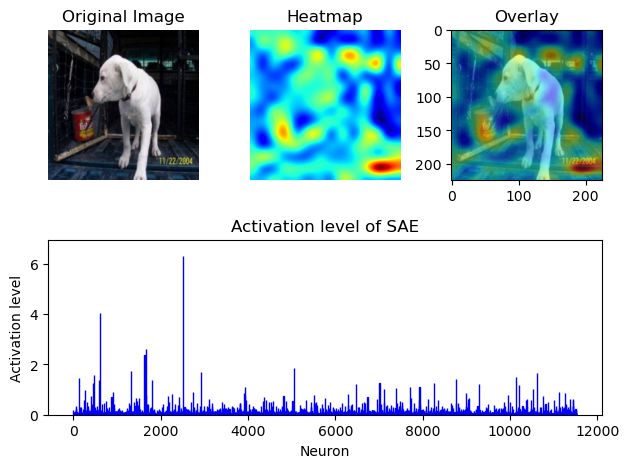

layer 4


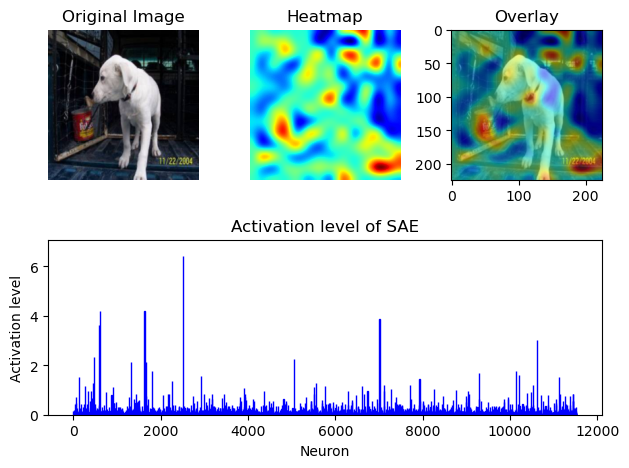

layer 5


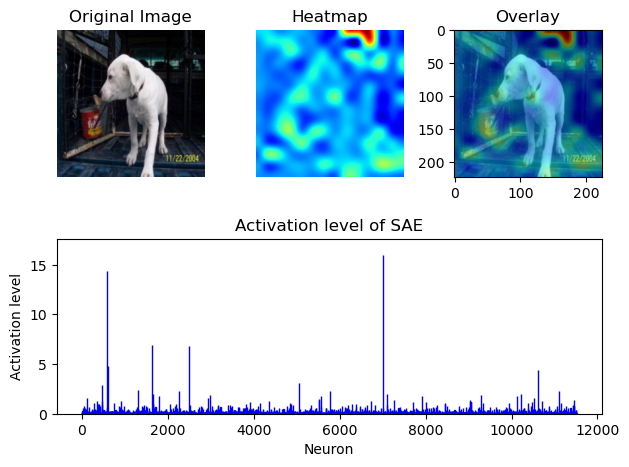

layer 6


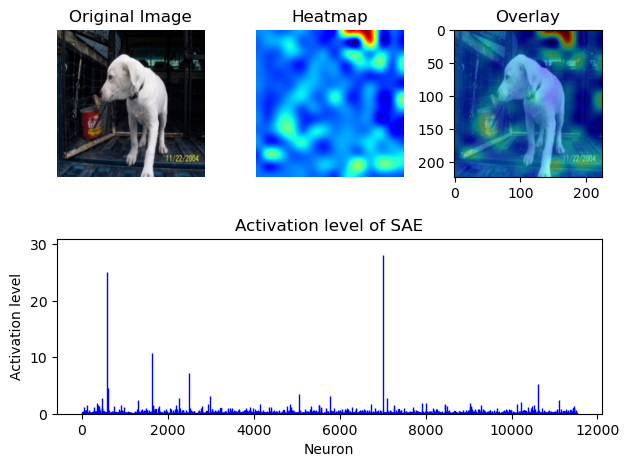

layer 7


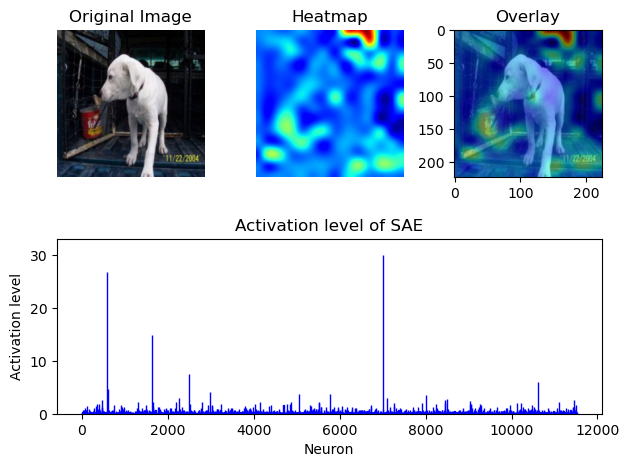

layer 8


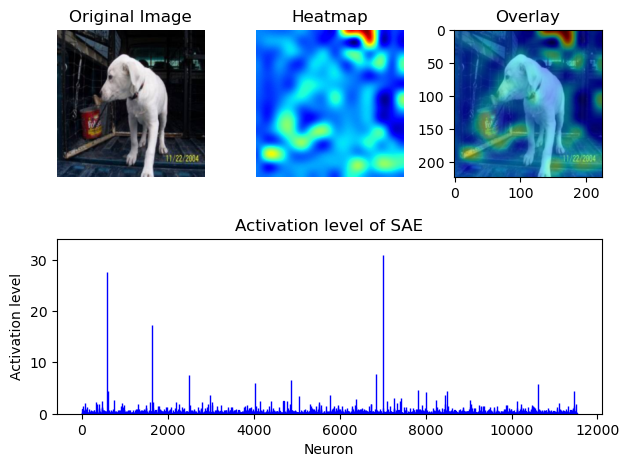

layer 9


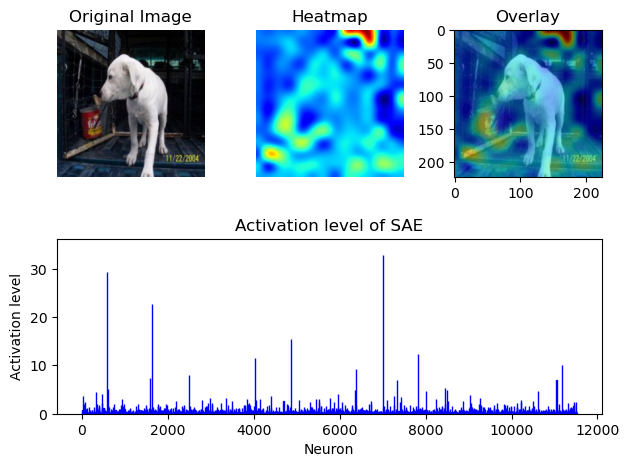

layer 10


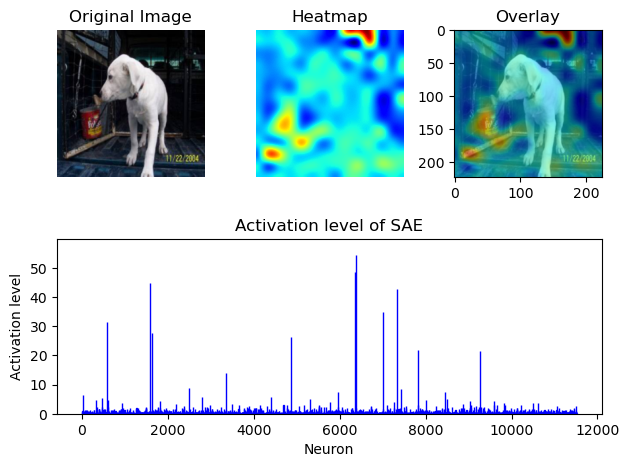

layer 11


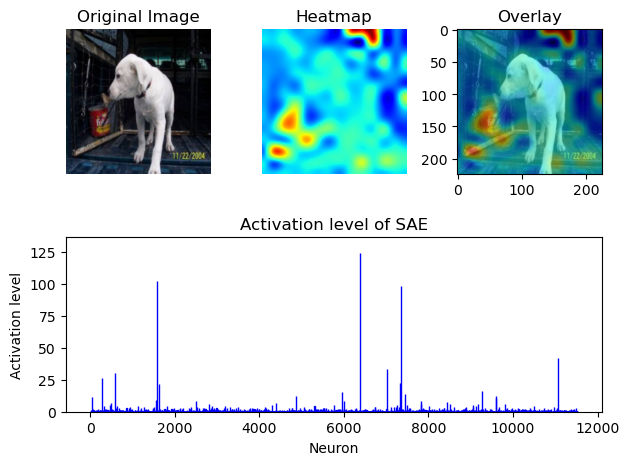

In [21]:
for i in range(12):
    print(f'layer {i}')
    plot_activation('akahana/vit-base-cats-vs-dogs','SAE_models/catdog_finetune/SAE_ratio15_epoch100_lr0.0001.pth',input_image4,layer_number = i, ratio=15, device= device)

In [22]:
# initiate the encoder and encoder_bias for SAE
encoder = torch.randn((768*15, 768)) # encoder
nn.init.xavier_uniform_(encoder)
encoder_bias = torch.zeros(768*15) # encoder bias

# Create a SAE instance
tied_sae = TiedSAE(encoder, encoder_bias)
tied_sae.load_state_dict(torch.load('SAE_models/catdog_finetune/SAE_ratio15_epoch100_lr0.0001.pth'))
tied_sae.to_device(device)

# Calculate the activation levels for the input patch
activations_1 =[]
activations_2 =[]
activations_3 =[]
activations_4 =[]


for i in range(12):
    activations_1.append(tied_sae.encode(activation_inputs1[i]).squeeze(0))
    activations_2.append(tied_sae.encode(activation_inputs2[i]).squeeze(0))
    activations_3.append(tied_sae.encode(activation_inputs3[i]).squeeze(0))
    activations_4.append(tied_sae.encode(activation_inputs4[i]).squeeze(0))

top_features1 = []
top_features2 = []
top_features3 = []
top_features4 = []

for i in range(12):
    # Detach the tensors before passing them to torch.topk()
    tensor1 = activations_1[i].mean(dim=0).detach().cpu()
    tensor2 = activations_2[i].mean(dim=0).detach().cpu()
    tensor3 = activations_3[i].mean(dim=0).detach().cpu()
    tensor4 = activations_4[i].mean(dim=0).detach().cpu()

    top_features1.append(torch.topk(tensor1, k=10, largest=True).indices)
    top_features2.append(torch.topk(tensor2, k=10, largest=True).indices)
    top_features3.append(torch.topk(tensor3, k=10, largest=True).indices)
    top_features4.append(torch.topk(tensor4, k=10, largest=True).indices)

In [23]:
print("Image 1")
[print(i) for i in top_features1]

print("Image 2")
[print(i) for i in top_features2]

print("Image 3")
[print(i) for i in top_features3]

print("Image 4")
[print(i) for i in top_features4]

Image 1
tensor([ 2503,   587,  7011,  3116,  9294,   275,  8641,  9958, 10137,  1315])
tensor([2503,  587, 7011,  275, 9294, 8641, 2752, 1630, 1315, 6953])
tensor([2503,  275, 1630, 9294, 2752,  587, 7011, 3942, 6953, 1315])
tensor([2503, 1630,  275, 9294,  587, 7011, 2752, 8459,  468, 1315])
tensor([2503, 7011, 1630,  587, 8459, 4863,  275, 9294,  468, 2752])
tensor([ 7011,   587,  1630,  2503,  8459,  4863, 10627,   468,  4033,  2752])
tensor([7011,  587, 1630, 8459, 2503, 4033, 6003, 4863, 2267, 1032])
tensor([ 7011,   587,  1630,  8459,  2503,  3424,  6003, 10627,  4140,  4033])
tensor([7011,  587, 1630, 8459, 2503, 3424, 7312, 9230, 7042, 2697])
tensor([7011,  587, 1630, 2697, 5727, 2517, 2902,  488, 9230, 8459])
tensor([ 2902,  2697,  5858,  7011,  2603,  1630,   587,  2517, 11443,  6154])
tensor([ 2902,  2603,  6342,  3653,  7011,   587,  2697,  1630, 11443, 11280])
Image 2
tensor([2503, 1469, 2773, 3116,  587, 7914, 7011,  155,  275, 7689])
tensor([2503, 2773, 1469,  587, 7011,

[None, None, None, None, None, None, None, None, None, None, None, None]

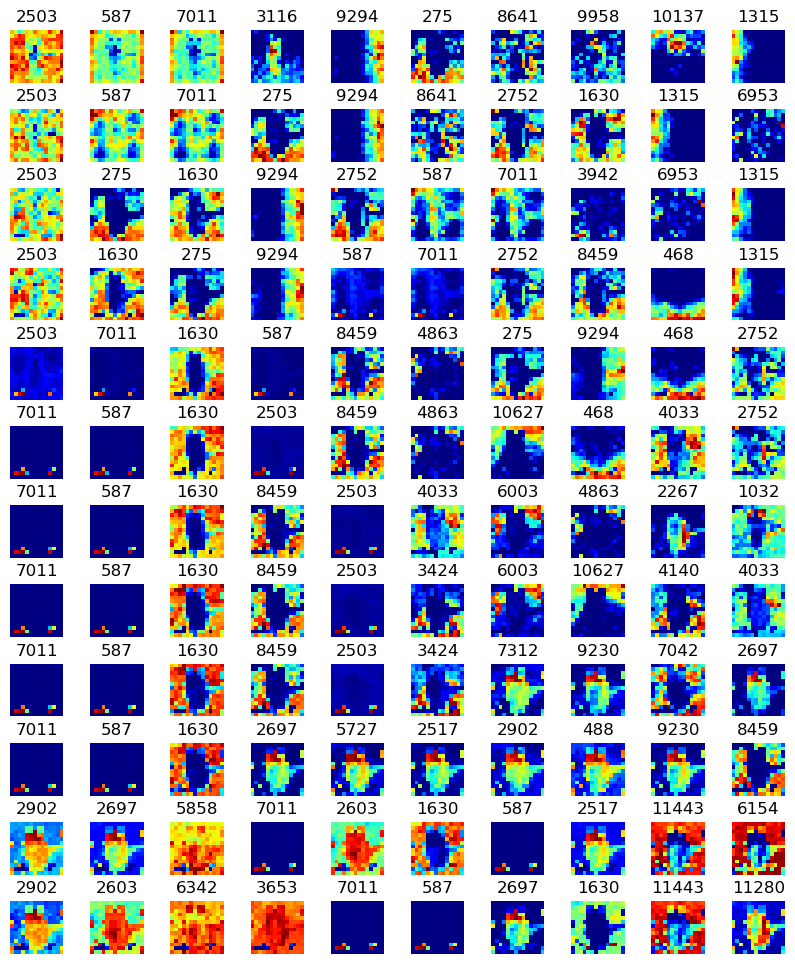

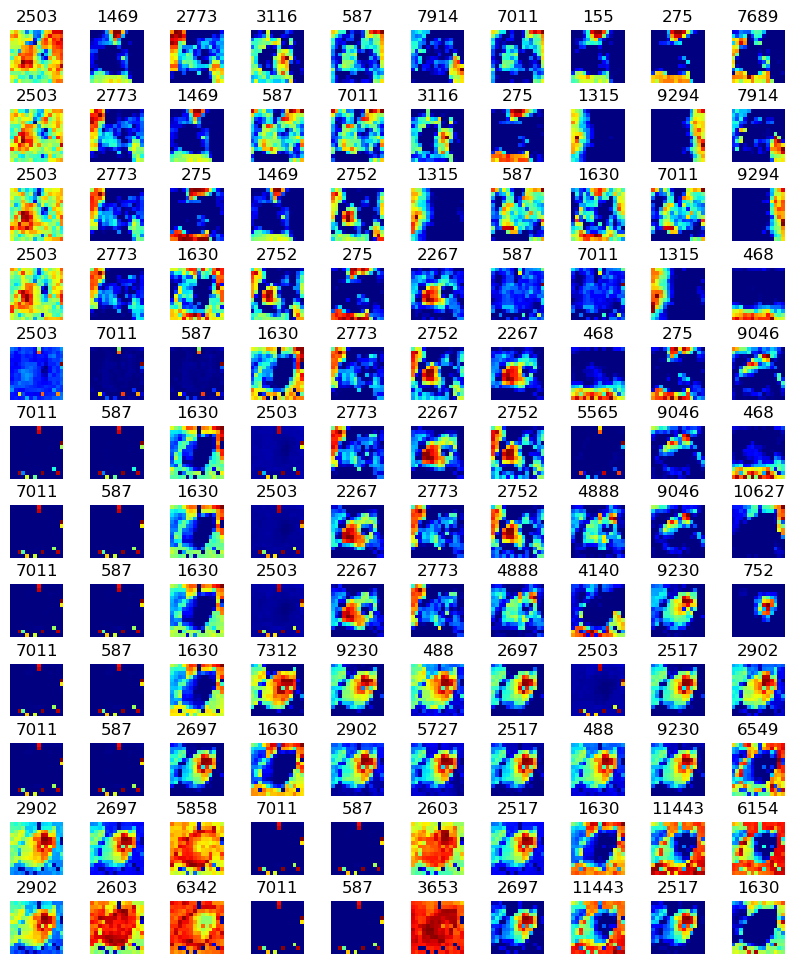

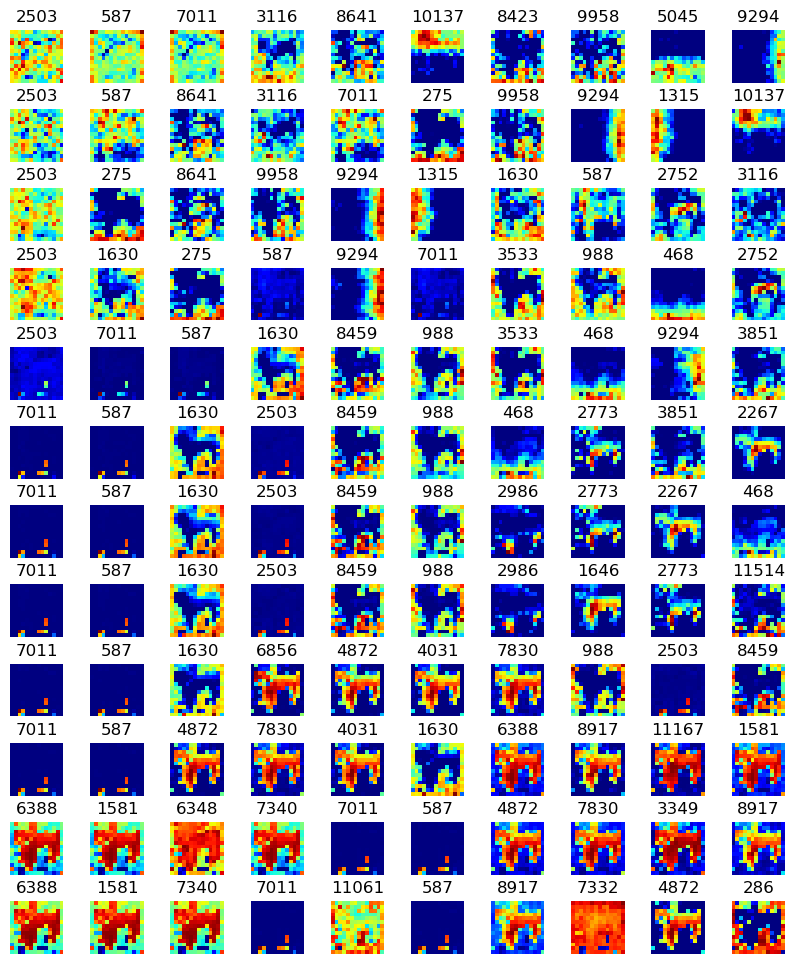

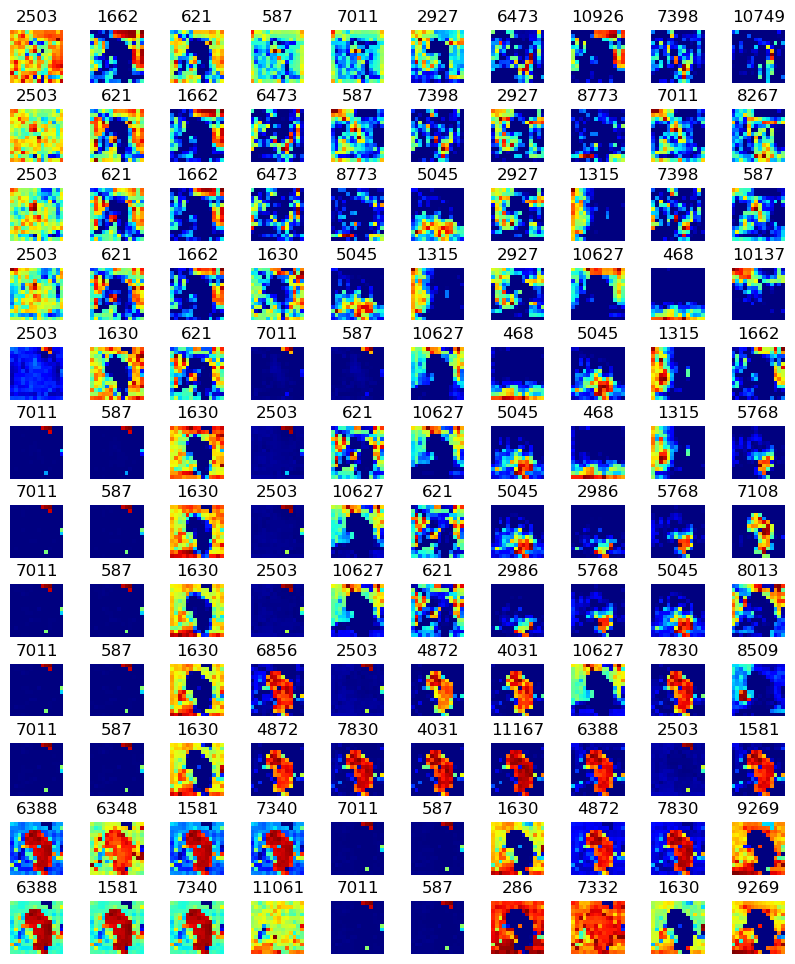

In [24]:
create_heatmap(activations_1, top_features1)
create_heatmap(activations_2, top_features2)
create_heatmap(activations_3, top_features3)
create_heatmap(activations_4, top_features4)